In [ ]:

!pip install segmentation_models
!pip install keras==2.3.1
!pip install tensorflow==2.1.0
!pip install keras_applications==1.0.8
!pip install image-classifiers==1.0.0
!pip install efficientnet==1.0.0



In [5]:
import glob
import os.path 
import cv2
import numpy as np 
import matplotlib
from matplotlib.pyplot import  imshow, show
import matplotlib.pyplot as plt 
from tqdm import tqdm
#from skimage.color import gray2rgb
#from skimage.io import imsave, imread


import datetime
from PIL import Image

from __future__ import print_function

import numpy as np
from skimage.transform import resize


import pandas as pd

import os
from skimage.transform import resize
from skimage.io import imsave
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import callbacks
from tensorflow.keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as K
import segmentation_models as sm
sm.set_framework('tf.keras')
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.applications import *
from tensorflow.keras.utils import plot_model

In [2]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.88 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/5144/862050/compressed/train.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1607606269&Signature=Kh480A7jpTPgCTXY1VGZwrnoGhYhKgAIliS%2BWz56oSp%2FJ3GKglTYh3jHgWFotch0YS4ciZJWYud4uXUUSB7hizQANCJdTf9Fv6%2FM3F8sm3Lyuu3vjUh6syDRVnJqTsjF8P%2F38AHfiuOahWC7UVQtypBiTB0G4KS94GBZvEAPU0jiJxQ9ZdmaWsvfd59jiDlWzXA%2B%2BydpzydJjZ5%2BNppUMMhhljYdc%2Bmp5Ap6bVzpZDx2HwKHMjTMqljLliOu2iGSnxfIgiI4C5dYI9WuwqH4MHjIWX6aezEVBXaEU%2B7Efqf0rSHI1qeyEenvOB0uNaNrD6wsvlqTR9LwgfGkOzQDHg%3D%3D&response-content-disposition=attachment%3B+filename%3Dtrain.zip" -c -O 'train.zip'

--2020-12-10 12:34:52--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/5144/862050/compressed/train.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1607606269&Signature=Kh480A7jpTPgCTXY1VGZwrnoGhYhKgAIliS%2BWz56oSp%2FJ3GKglTYh3jHgWFotch0YS4ciZJWYud4uXUUSB7hizQANCJdTf9Fv6%2FM3F8sm3Lyuu3vjUh6syDRVnJqTsjF8P%2F38AHfiuOahWC7UVQtypBiTB0G4KS94GBZvEAPU0jiJxQ9ZdmaWsvfd59jiDlWzXA%2B%2BydpzydJjZ5%2BNppUMMhhljYdc%2Bmp5Ap6bVzpZDx2HwKHMjTMqljLliOu2iGSnxfIgiI4C5dYI9WuwqH4MHjIWX6aezEVBXaEU%2B7Efqf0rSHI1qeyEenvOB0uNaNrD6wsvlqTR9LwgfGkOzQDHg%3D%3D&response-content-disposition=attachment%3B+filename%3Dtrain.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.97.128, 74.125.203.128, 74.125.204.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.97.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1148179100 (1.1G) [application/zip]
Saving to: ‘train.zip’

train.zip           100%[=====

In [3]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.88 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/5144/862050/compressed/test.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1607606292&Signature=bXwjmiLNmKX%2FInpa87XTg04dM33w3xJSWMnPB1Hyg3LhMPzPL6jXlRTWTS8FU7boDLdmUVd7XBX%2BaR5aCIE4jpxOdgTmxmAh4MiK9Bo%2FFkW9JTCYIUIRgwm%2F%2By9dqzqkjBcR6Hxegyyq4ysguLbNahXmBBSXF6eOPLZmXBdt%2B8BgCOC%2BFhVFnYrrY6iUnmHtahkpyJIfaf2wJkqjlOSDmD1VrRtD9VPSMYZvY8ChObmrS8j9uxTbKku1ojDhZROQb6yaEYM7cialjHAanycgl2%2BQoBh%2BHx9kuWjKhdP1X19oJHdBCsqquoN%2F15W660P%2F5Xd9TtYUQTnsYQO0ugxUGA%3D%3D&response-content-disposition=attachment%3B+filename%3Dtest.zip" -c -O 'test.zip'

--2020-12-10 12:36:09--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/5144/862050/compressed/test.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1607606292&Signature=bXwjmiLNmKX%2FInpa87XTg04dM33w3xJSWMnPB1Hyg3LhMPzPL6jXlRTWTS8FU7boDLdmUVd7XBX%2BaR5aCIE4jpxOdgTmxmAh4MiK9Bo%2FFkW9JTCYIUIRgwm%2F%2By9dqzqkjBcR6Hxegyyq4ysguLbNahXmBBSXF6eOPLZmXBdt%2B8BgCOC%2BFhVFnYrrY6iUnmHtahkpyJIfaf2wJkqjlOSDmD1VrRtD9VPSMYZvY8ChObmrS8j9uxTbKku1ojDhZROQb6yaEYM7cialjHAanycgl2%2BQoBh%2BHx9kuWjKhdP1X19oJHdBCsqquoN%2F15W660P%2F5Xd9TtYUQTnsYQO0ugxUGA%3D%3D&response-content-disposition=attachment%3B+filename%3Dtest.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 64.233.189.128, 108.177.97.128, 108.177.125.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|64.233.189.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1116759118 (1.0G) [application/zip]
Saving to: ‘test.zip’

test.zip            100%[===

In [ ]:
!unzip train.zip
! mkdir train
! mv *.tif train/


In [ ]:
! unzip test.zip
! mkdir test
! mv *.tif test/


train/46_43.tif
train/46_43_mask.tif


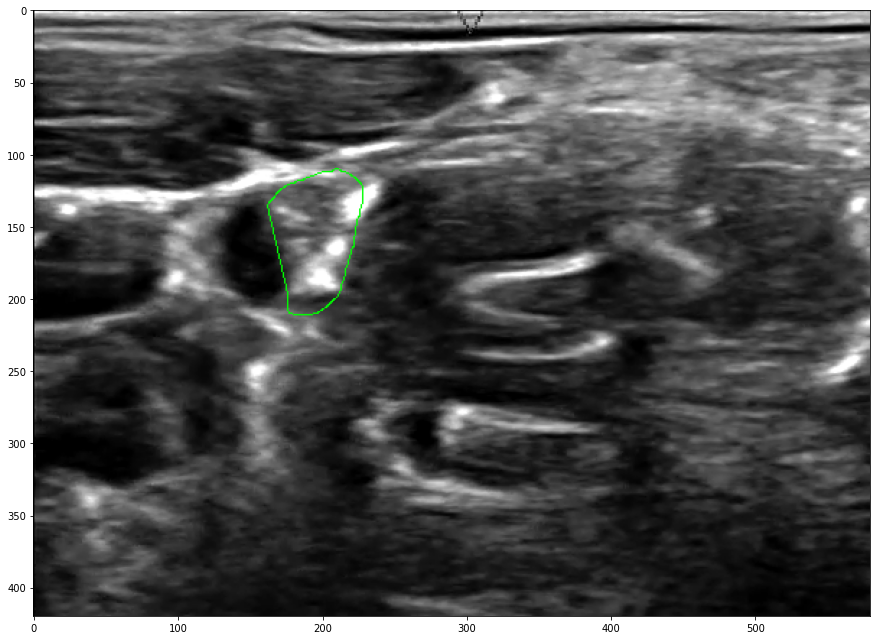

train/34_75.tif
train/34_75_mask.tif


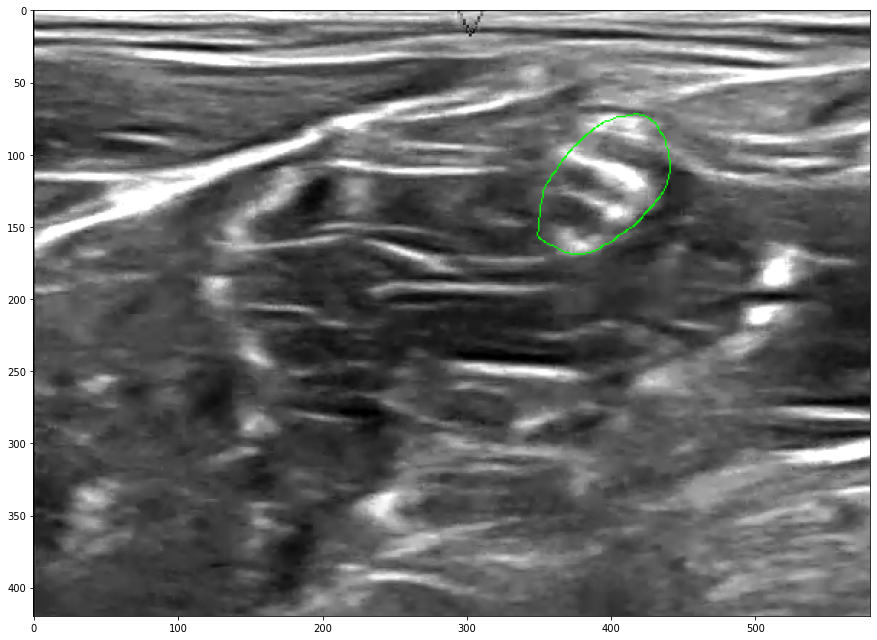

train/13_73.tif
train/13_73_mask.tif


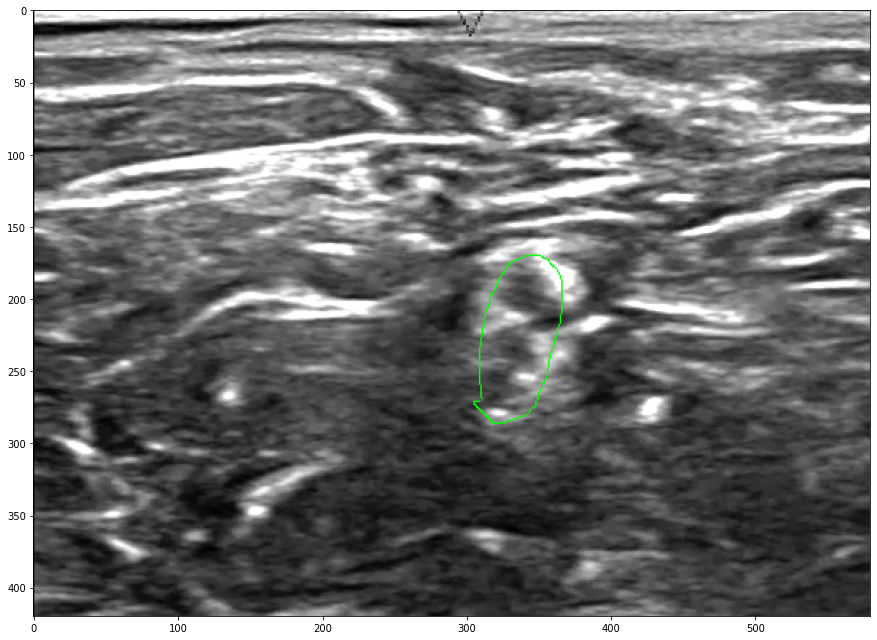

train/32_74.tif
train/32_74_mask.tif


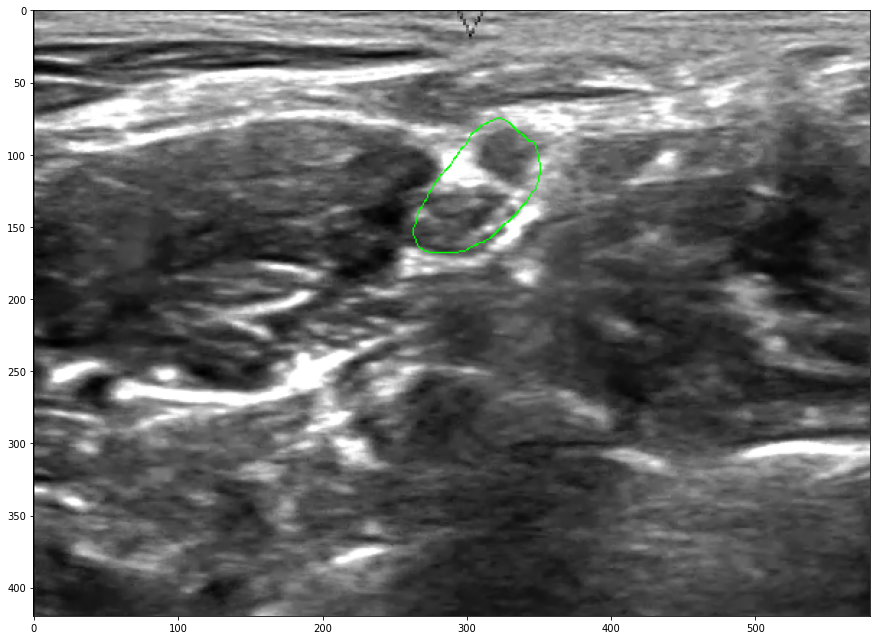

In [6]:
ultrasonic_images=[]

for images in glob.glob("train/*.tif"):
    if "mask" not in images:
        ultrasonic_images.append(images)
 
def image_to_mask(img_path):
    ''' convert an image file path into a corresponding mask file path '''
    dirname, basename = os.path.split(img_path)
    maskname = basename.replace(".tif", "_mask.tif")
    return os.path.join(dirname, maskname)

mask_images=[image_to_mask(img) for img in ultrasonic_images]

def image_with_mask(img, mask):
    ''' to add the mask on the image with outer layer in green '''
    img = grays_to_RGB(img)
    mask_edges = cv2.Canny(mask, 100, 200) > 0  
    img[mask_edges, 0] = 0  
    img[mask_edges, 1] = 255 #Making green colour mask
    img[mask_edges, 2] = 0
    return img
def grays_to_RGB(img):
    ''' turn 2D grayscale image into grayscale RGB '''
    return np.dstack((img, img, img)) 


def mask_not_blank(mask):
    return sum(mask.flatten()) > 0

count=0

for f_ultrasound, f_mask in zip(ultrasonic_images, mask_images):
    
    

    img  = plt.imread(f_ultrasound)
    mask = plt.imread(f_mask)

    if mask_not_blank(mask):

        print(f_ultrasound)
        print(f_mask)

        plt.figure(figsize=(15,20))
    
        plt.imshow(image_with_mask(img, mask))

        plt.show()
    
        if count==3:
             break;
                                
        count=count+1
    
    



In [ ]:
# Creating train data to pass to the model

"""

ultrasonic_images_count=0
mask_images_count=0


for image in glob.glob("train/*.tif"):
    if 'mask' not in image:
        ultrasonic_images_count+=1
    else:
        mask_images_count+=1
        
print(ultrasonic_images_count)
print(mask_images_count)


rows=420
columns=580
    
ultra_son_images=np.ndarray((ultrasonic_images_count, rows, columns) ,dtype=np.uint8)
ultra_son_masks=np.ndarray((mask_images_count, rows, columns),  dtype=np.uint8)

images=os.listdir("train/")
i=0

for image in tqdm(images):
    if 'mask' not in image:
        mask_name=image.split('.')[0]+'_mask.tif'
        image_name=image
        
        ultra_son_image=cv2.imread(os.path.join("train/",image_name),0)
        ultra_son_mask=cv2.imread(os.path.join("train/", mask_name),0)
        
        ultra_son_image = np.array([ultra_son_image])
        ultra_son_mask = np.array([ultra_son_mask])
        
        

        ultra_son_images[i] = ultra_son_image
        ultra_son_masks[i] = ultra_son_mask
        
        i=i+1

    
np.save('ultrasonic_images_data.npy', ultra_son_images)
np.save('ultrasonic_masks_data.npy', ultra_son_masks)      


"""


5635
5635


100%|██████████| 11270/11270 [00:22<00:00, 490.03it/s]


In [7]:
def mask_not_blank(mask):
    return sum(mask.flatten()) > 0

In [7]:
# Creating train data to pass to the model for only masks which have segmentation

ultrasonic_images_count=0
mask_images_count=0

images=os.listdir("train/")




for image in tqdm(images):
    if 'mask' not in image:
        mask_name=image.split('.')[0]+'_mask.tif'
        image_name=image
        if mask_not_blank(cv2.imread(os.path.join("train/", mask_name),0)):
            mask_images_count +=1
            ultrasonic_images_count+=1
    
print(ultrasonic_images_count)
print(mask_images_count)


rows=420
columns=580
    
ultra_son_images=np.ndarray((ultrasonic_images_count, rows, columns) ,dtype=np.uint8)
ultra_son_masks=np.ndarray((mask_images_count, rows, columns),  dtype=np.uint8)


i=0


for image in tqdm(images):
    if 'mask' not in image:
        mask_name=image.split('.')[0]+'_mask.tif'
        image_name=image

        if mask_not_blank(cv2.imread(os.path.join("train/", mask_name),0)):
        
            ultra_son_image=cv2.imread(os.path.join("train/",image_name),0)
            ultra_son_mask=cv2.imread(os.path.join("train/", mask_name),0)
        
            ultra_son_image = np.array([ultra_son_image])
            ultra_son_mask = np.array([ultra_son_mask])
        
        

            ultra_son_images[i] = ultra_son_image
            ultra_son_masks[i] = ultra_son_mask
        
            i=i+1

    
np.save('ultrasonic_images_data_with_segmentation.npy', ultra_son_images)
np.save('ultrasonic_masks_data_with_segmentation.npy', ultra_son_masks)      


  0%|          | 4/11270 [00:00<05:05, 36.89it/s]

2323
2323


100%|██████████| 11270/11270 [04:56<00:00, 38.06it/s]


In [8]:
ultra_son_images.shape

(2323, 420, 580)

In [8]:
# Creating train data to pass to the classification model

classification_labels=[]

images=os.listdir("train/")
ultrasonic_images_count=0

rows=420
columns=580


for image in glob.glob("train/*.tif"):
    if 'mask' not in image:
        ultrasonic_images_count+=1

    
ultra_son_images_for_classification=np.ndarray((ultrasonic_images_count, rows, columns) ,dtype=np.uint8)


i=0


for image in tqdm(images):
    if 'mask' not in image:
        mask_name=image.split('.')[0]+'_mask.tif'
        image_name=image

        if mask_not_blank(cv2.imread(os.path.join("train/", mask_name),0)):
        
            ultra_son_image=cv2.imread(os.path.join("train/",image_name),0)
            ultra_son_image= np.array([ultra_son_image])
            ultra_son_images_for_classification[i] = ultra_son_image

            classification_labels.append(1)
            i=i+1
        else:
            
            ultra_son_image=cv2.imread(os.path.join("train/",image_name),0)
            ultra_son_image = np.array([ultra_son_image])
            ultra_son_images_for_classification[i] = ultra_son_image
            classification_labels.append(0)        
            i=i+1

    
np.save('ultrasonic_images_data_for_clasification.npy', ultra_son_images_for_classification)
      


100%|██████████| 11270/11270 [05:15<00:00, 35.70it/s]


In [9]:
ultra_son_images_for_classification= np.load('ultrasonic_images_data_for_clasification.npy')
print(ultra_son_images_for_classification.shape)
print(len(classification_labels))
print(classification_labels[:4])

(5635, 420, 580)
5635
[0, 1, 0, 1]


In [13]:
# Creating test data to pass to the model

test_images_count=len(os.listdir('test'))

rows=420
columns=580
    
test_images=np.ndarray((test_images_count, rows, columns) ,dtype=np.uint8)
test_ids=[]



test_us_images=os.listdir("test/")

i=0

for image in tqdm(test_us_images):

    img_id = int(image.split('.')[0])
 
    test_image=cv2.imread(os.path.join("test/",image),0)
    test_image = np.array([test_image])
    
    test_images[i] = test_image
    test_ids.append(img_id)
    i=i+1

test_ids=np.array(test_ids)    
np.save('test_ids.npy', test_ids)
np.save('test_data.npy', test_images)
    
        


100%|██████████| 5508/5508 [00:19<00:00, 282.38it/s]


In [10]:
def preprocess(imgs, img_rows, img_cols):

    ''' Preprocessing for grey scale images and returns grey scale image''' 
    imgs_p = np.ndarray((imgs.shape[0], img_rows, img_cols), dtype=np.uint8)
    for i in range(imgs.shape[0]):
        imgs_p[i] = resize(imgs[i], (img_rows, img_cols), preserve_range=True)

    imgs_p = imgs_p[..., np.newaxis]
    return imgs_p


def preprocess_images(imgs, img_rows, img_cols):
    ''' Preprocessing for grey scale images and returns a 3 layer image used in Double-Unet''' 
    imgs_p = np.ndarray((imgs.shape[0], img_rows, img_cols), dtype=np.uint8)
    for i in range(imgs.shape[0]):
        imgs_p[i] = resize(imgs[i], (img_rows, img_cols), preserve_range=True)
    imgs_p=np.repeat(imgs_p[..., np.newaxis], 3, -1)
    return imgs_p



def preprocess_masks(imgs, img_rows_img_cols):
    ''' Preprocessing for grey scale images and returns a 2 layer image used in Double Unet''' 
    imgs_p = np.ndarray((imgs.shape[0], img_rows, img_cols), dtype=np.uint8)
    for i in range(imgs.shape[0]):
        imgs_p[i] = resize(imgs[i], (img_rows, img_cols), preserve_range=True)
    imgs_p=np.repeat(imgs_p[..., np.newaxis], 2, -1)
    return imgs_p


In [11]:
def train_validation_split(imgs, imgs_mask):
    ''' Custom train validation split function on images and corresponding masks '''
    imgs = imgs.astype('float32')

    imgs_train=imgs[:2000]

    mean = np.mean(imgs_train)  # mean for data centering
    std = np.std(imgs_train)  # std for data normalization

    imgs_train -= mean
    imgs_train /= std

    imgs_mask_train=imgs_mask[:2000]
    imgs_mask_train = imgs_mask_train.astype('float32')
    imgs_mask_train /= 255.  # scale masks to [0, 1]

    imgs_validation= imgs[2000:]
    imgs_validation -= mean
    imgs_validation /= std


    imgs_mask_validation = imgs_mask[2000:]
    imgs_mask_validation = imgs_mask_validation.astype('float32')
    imgs_mask_validation /= 255.  # scale masks to [0, 1]

    return imgs_train, imgs_mask_train, imgs_validation, imgs_mask_validation

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96, 96, 3)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 94, 94, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 47, 47, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 47, 47, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 45, 45, 8)         2312      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 22, 22, 8)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 22, 22, 8)         0     

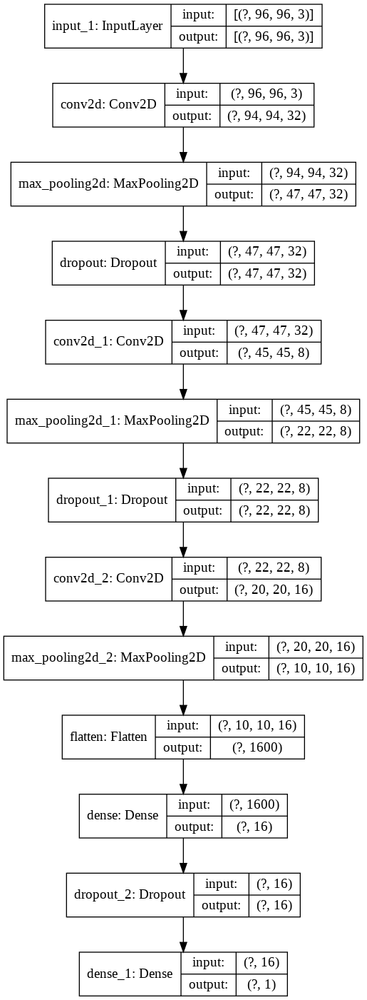

In [12]:
img_rows=96
img_cols=96

tf.keras.backend.clear_session()
def classification_model():

    ''' Function to return the classification model which classifies whether mask is present or not in the given image '''

    input = Input((img_rows, img_cols, 3))
    x = Conv2D(32, (3, 3), activation='relu')(input)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Dropout(0.1)(x)
    x = Conv2D(8, (3, 3), activation='relu')(x)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = Dropout(0.1)(x)
    x = Conv2D(16, (3, 3), activation='relu')(x)
    x = MaxPooling2D(pool_size=(2,2))(x)
    x = Flatten()(x)
    x = Dense(16, activation='relu')(x)
    x = Dropout(0.25)(x)
    
    output = Dense(1, activation='sigmoid')(x)

    return Model(inputs=input, outputs= output)

classification_model= classification_model()

classification_model.summary()

plot_model(classification_model, show_shapes=True)
    


In [13]:
def train_validation_split_for_classification(images, labels):

    imgs = images.astype('float32')

    imgs_train=imgs[:4800]

    mean = np.mean(imgs_train)  # mean for data centering
    std = np.std(imgs_train)  # std for data normalization

    imgs_train -= mean
    imgs_train /= std

  

    imgs_validation= imgs[4800:]
    imgs_validation -= mean
    imgs_validation /= std


    labels_train= labels[:4800]
    labels_validation= labels[4800:]

    return imgs_train, np.asarray(labels_train), imgs_validation, np.asarray(labels_validation), mean, std






In [14]:
images= preprocess_images(ultra_son_images_for_classification, 96,96)
imgs_train, labels_train, imgs_validation, labels_validation, train_images_mean, train_images_std= train_validation_split_for_classification(images, classification_labels)



In [54]:
#compiling and training the model 



classification_model.compile(optimizer=Adam(lr=0.0001), loss='binary_crossentropy', metrics=['accuracy'])


!rm -r logs_classification_model*


log_dir="logs_classification_model\\fit\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)



model_checkpoint = ModelCheckpoint('Classification_model_weights.h5', monitor='val_loss', save_best_only=True)

callback_list = [ tensorboard_callback,model_checkpoint]

history=classification_model.fit(x=imgs_train, y=labels_train, batch_size=32, epochs=30, verbose=1, shuffle=True,
              validation_data= [imgs_validation, labels_validation],
              callbacks=callback_list)

Train on 4800 samples, validate on 835 samples
Epoch 1/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.6768 - accuracy: 0.5863 - val_loss: 0.6489 - val_accuracy: 0.6515
Epoch 2/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.6329 - accuracy: 0.6515 - val_loss: 0.6144 - val_accuracy: 0.7090
Epoch 3/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.6097 - accuracy: 0.6873 - val_loss: 0.5885 - val_accuracy: 0.7162
Epoch 4/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.5861 - accuracy: 0.7092 - val_loss: 0.5753 - val_accuracy: 0.7138
Epoch 5/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.5721 - accuracy: 0.7154 - val_loss: 0.5593 - val_accuracy: 0.7281
Epoch 6/30
4800/4800 [==============================] - 6s 1ms/sample - loss: 0.5555 - accuracy: 0.7287 - val_loss: 0.5552 - val_accuracy: 0.7365
Epoch 7/30
4800/4800 [==============================] - 6s 1ms/sample - loss:

In [41]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [42]:
%tensorboard --logdir logs_classification_model\\fit\\20201210-133112

<IPython.core.display.Javascript object>

In [43]:
predictions=classification_model.predict(imgs_validation)

mistakes=0
correct=0

for index, value in enumerate(predictions):


    if (value < 0.5 and  labels_validation[index]==1) or (value>= 0.5 and labels_validation[index]==0):
        mistakes+=1
    else:
        correct+=1
    
print("Number of images wrong classified: ",mistakes)
print("Number of images correctly classified: ",correct)

print("Percentage of correctly classified images: ", np.round(correct/(correct+mistakes)*100,2))

    
    

Number of images wrong classified:  187
Number of images correctly classified:  648
Percentage of correctly classified images:  77.6


In [29]:
dice_loss= sm.losses.DiceLoss() #defining loss function

In [30]:
def dice_coef(y_true, y_pred):

    ''' function to return dice coefficient metric 
        on passing the true mask and predicted mask region 
    '''
    smooth=1

   
    y_true_f = K.flatten(y_true)
    y_pred_f= K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    sums = K.sum(y_true_f) + K.sum(y_pred_f)
    return (2 * intersection + smooth) / (sums + smooth)


# <h1>UNET

Model created...
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 640         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 64, 64, 64)   0           conv2d_1[0][0]                   
_____________________________________________________________________________

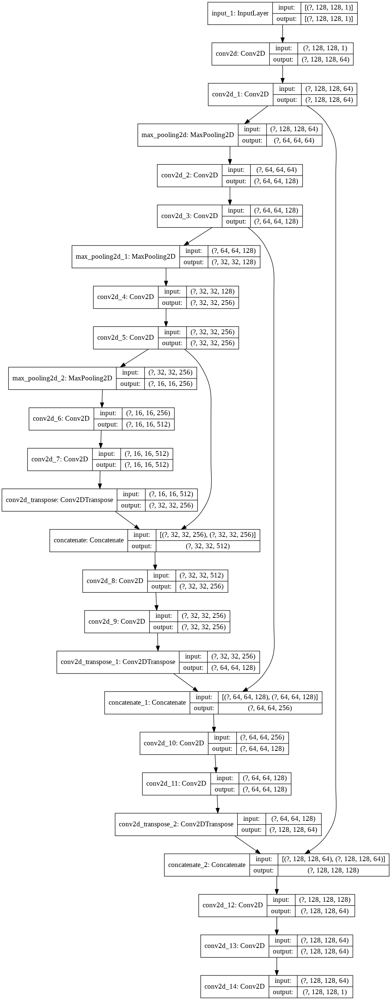

In [ ]:
tf.keras.backend.clear_session()

img_rows = 128
img_cols = 128

def create_initial_model():

    '''
    Initial model and a U-Net like architecture with few modifications and less filters 
    
    '''
    inputs = Input((img_rows, img_cols, 1))

    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)




    up1 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4), conv3], axis=3)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(up1)
    conv5 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

    up2 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5), conv2], axis=3)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up2)
    conv6 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

    up3 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6), conv1], axis=3)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)
    conv7 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)


    conv8 = Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = Model(inputs=[inputs], outputs=[conv8])

    return model

initial_model=create_initial_model()

print("Model created...")

initial_model.summary()

plot_model(initial_model, show_shapes=True)

In [ ]:
import datetime

img_rows = 128
img_cols = 128

ultra_son_images=np.load('ultrasonic_images_data_with_segmentation.npy')
ultra_son_masks= np.load('ultrasonic_masks_data_with_segmentation.npy')


print("loading images and masks completed....")

imgs= preprocess(ultra_son_images)
imgs_mask = preprocess(ultra_son_masks)

print("Preprocessing of images, masks are completed..")



imgs_train_initial_model, imgs_mask_train_initial_model, imgs_validation_initial_model, imgs_mask_validation_initial_model= train_validation_split(imgs, imgs_mask)


In [ ]:
print(imgs_train_initial_model.shape)
print(imgs_validation_initial_model.shape)

(2000, 128, 128, 1)
(323, 128, 128, 1)


In [ ]:
#compiling and training the model 

initial_model.compile(optimizer=Adam(lr=0.00001), loss=dice_loss, metrics=[dice_coef])


!rm -r logs_initial_model*

log_dir="logs_initial_model\\fit\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)

model_checkpoint = ModelCheckpoint('Initial_unet_like_model_weights.h5', monitor='val_loss', save_best_only=True)

callback_list = [tensorboard_callback,model_checkpoint]

history=initial_model.fit(x=imgs_train_initial_model, y=imgs_mask_train_initial_model, batch_size=32, epochs=40, verbose=1, shuffle=True,
              validation_data= [imgs_validation_initial_model, imgs_mask_validation_initial_model],
              callbacks=callback_list)

Train on 2000 samples, validate on 323 samples
Epoch 1/40
2000/2000 [==============================] - 60s 30ms/sample - loss: 0.9431 - dice_coef: 0.0568 - val_loss: 0.9409 - val_dice_coef: 0.0593
Epoch 2/40
2000/2000 [==============================] - 52s 26ms/sample - loss: 0.9378 - dice_coef: 0.0623 - val_loss: 0.9295 - val_dice_coef: 0.0706
Epoch 3/40
2000/2000 [==============================] - 52s 26ms/sample - loss: 0.8900 - dice_coef: 0.1110 - val_loss: 0.7542 - val_dice_coef: 0.2466
Epoch 4/40
2000/2000 [==============================] - 52s 26ms/sample - loss: 0.6523 - dice_coef: 0.3480 - val_loss: 0.5460 - val_dice_coef: 0.4550
Epoch 5/40
2000/2000 [==============================] - 52s 26ms/sample - loss: 0.5596 - dice_coef: 0.4400 - val_loss: 0.4960 - val_dice_coef: 0.5028
Epoch 6/40
2000/2000 [==============================] - 52s 26ms/sample - loss: 0.5116 - dice_coef: 0.4888 - val_loss: 0.4844 - val_dice_coef: 0.5133
Epoch 7/40
2000/2000 [==============================]

In [35]:
def grays_to_RGB(img):
    ''' turn 2D grayscale image into grayscale RGB '''
    return np.dstack((img, img, img)) 

def image_with_mask(img, mask):
    ''' to add the mask on the image with outer layer in green '''
    img = grays_to_RGB(img)
    mask_edges = cv2.Canny(mask, 100, 200) > 0  
    img[mask_edges, 0] = 255  
    img[mask_edges, 1] = 0 
    img[mask_edges, 2] = 0
    return img

def image_with_mask1(img, mask):
    ''' to add the mask on the image with outer layer in green '''
    #img = grays_to_RGB(img)
    mask_edges = cv2.Canny(mask, 100, 200) > 0  
    img[mask_edges, 0] = 0  
    img[mask_edges, 1] = 255 #Making green colour mask
    img[mask_edges, 2] = 0
    return img


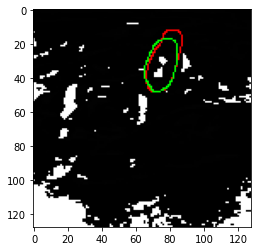

tf.Tensor(0.85810816, shape=(), dtype=float32)


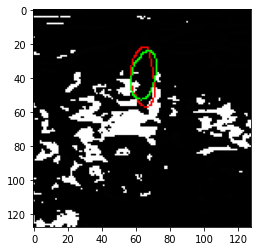

tf.Tensor(0.796609, shape=(), dtype=float32)


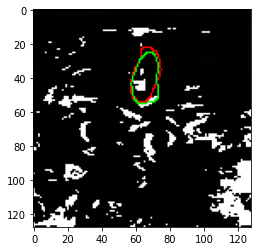

tf.Tensor(0.8524518, shape=(), dtype=float32)


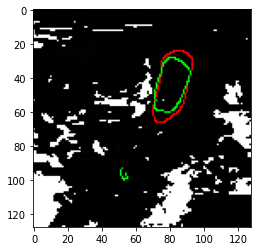

tf.Tensor(0.79728, shape=(), dtype=float32)


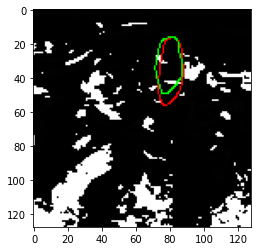

tf.Tensor(0.80032265, shape=(), dtype=float32)


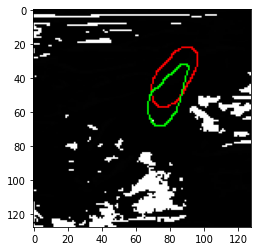

tf.Tensor(0.54852086, shape=(), dtype=float32)


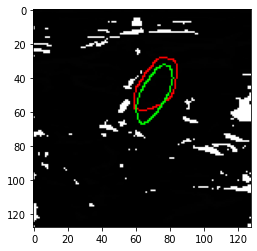

tf.Tensor(0.7249702, shape=(), dtype=float32)


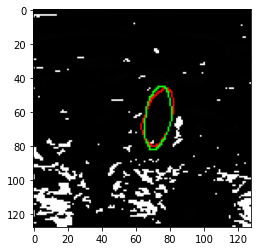

tf.Tensor(0.893704, shape=(), dtype=float32)


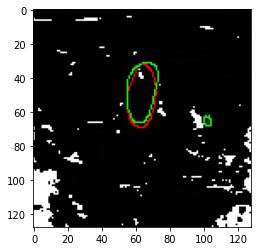

tf.Tensor(0.84092885, shape=(), dtype=float32)


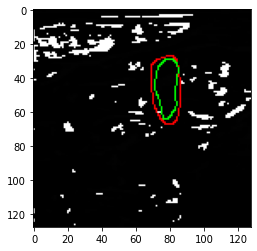

tf.Tensor(0.7611036, shape=(), dtype=float32)


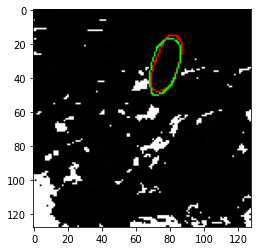

tf.Tensor(0.88339245, shape=(), dtype=float32)


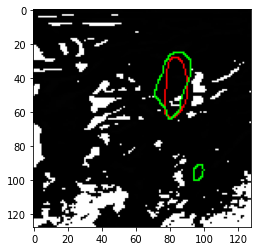

tf.Tensor(0.70593125, shape=(), dtype=float32)


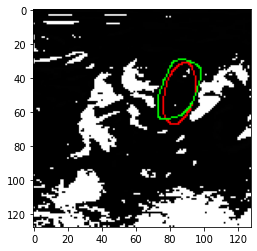

tf.Tensor(0.8155071, shape=(), dtype=float32)


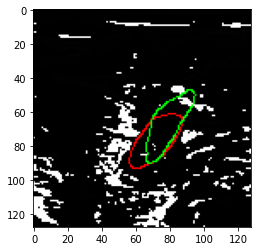

tf.Tensor(0.63199186, shape=(), dtype=float32)


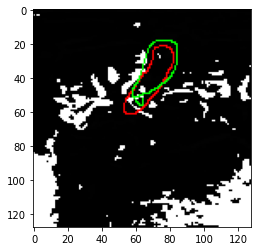

tf.Tensor(0.7066237, shape=(), dtype=float32)


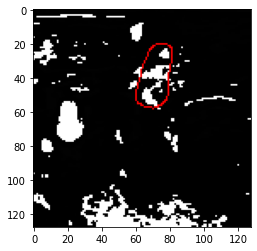

tf.Tensor(0.0017092708, shape=(), dtype=float32)


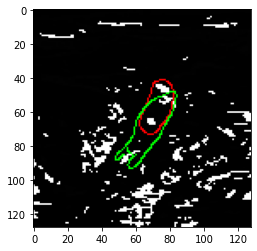

tf.Tensor(0.5981956, shape=(), dtype=float32)


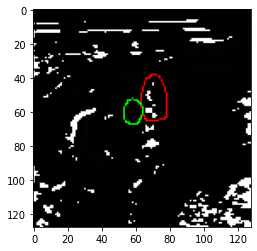

tf.Tensor(0.009203066, shape=(), dtype=float32)


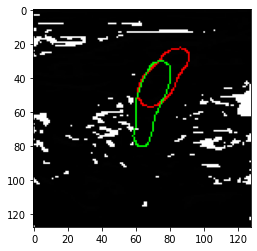

tf.Tensor(0.579303, shape=(), dtype=float32)


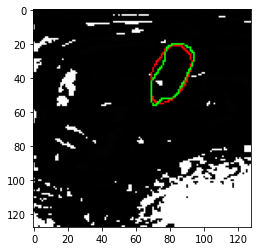

tf.Tensor(0.8777163, shape=(), dtype=float32)


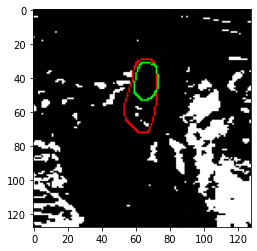

tf.Tensor(0.54598284, shape=(), dtype=float32)


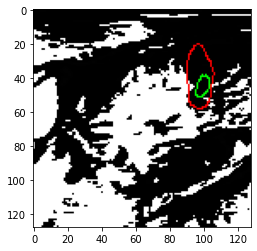

tf.Tensor(0.2779768, shape=(), dtype=float32)


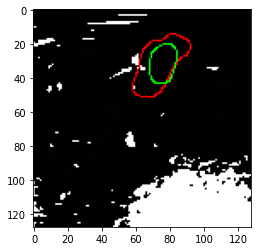

tf.Tensor(0.5623387, shape=(), dtype=float32)


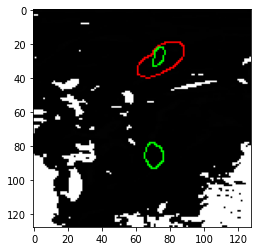

tf.Tensor(0.18816738, shape=(), dtype=float32)


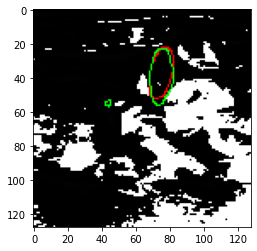

tf.Tensor(0.84332174, shape=(), dtype=float32)


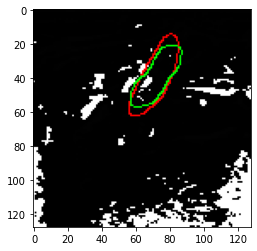

tf.Tensor(0.80995625, shape=(), dtype=float32)


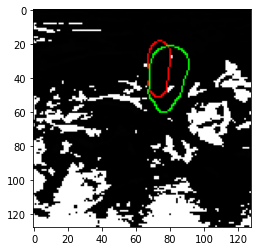

tf.Tensor(0.5505984, shape=(), dtype=float32)


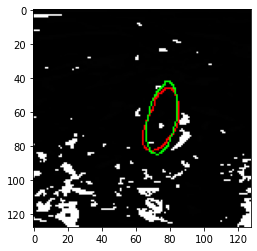

tf.Tensor(0.87359536, shape=(), dtype=float32)


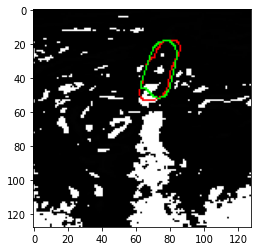

tf.Tensor(0.85985416, shape=(), dtype=float32)


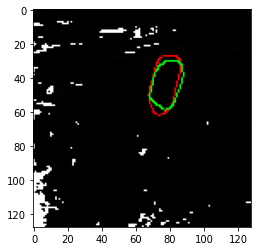

tf.Tensor(0.8289192, shape=(), dtype=float32)


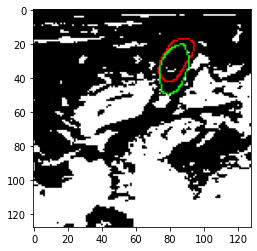

tf.Tensor(0.70083165, shape=(), dtype=float32)


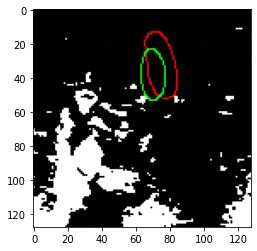

tf.Tensor(0.5028656, shape=(), dtype=float32)


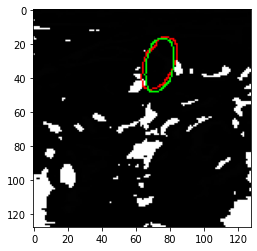

tf.Tensor(0.8555563, shape=(), dtype=float32)


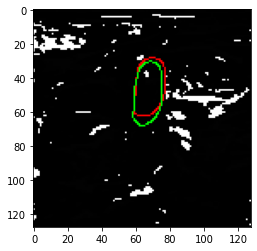

tf.Tensor(0.8409722, shape=(), dtype=float32)


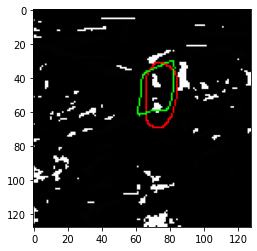

tf.Tensor(0.72110415, shape=(), dtype=float32)


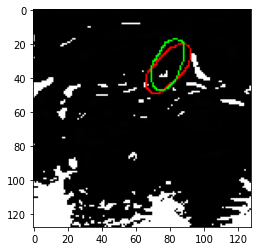

tf.Tensor(0.7822803, shape=(), dtype=float32)


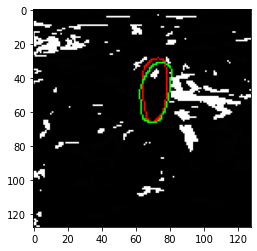

tf.Tensor(0.8326937, shape=(), dtype=float32)


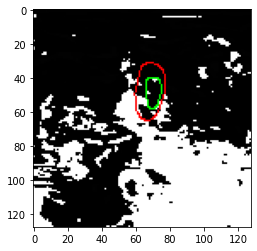

tf.Tensor(0.45134574, shape=(), dtype=float32)


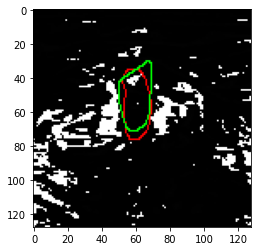

tf.Tensor(0.79572994, shape=(), dtype=float32)


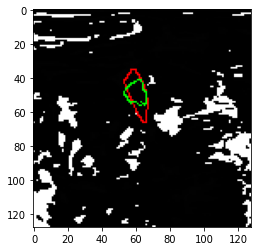

tf.Tensor(0.5901358, shape=(), dtype=float32)


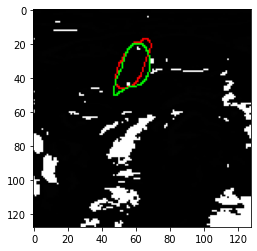

tf.Tensor(0.80000055, shape=(), dtype=float32)


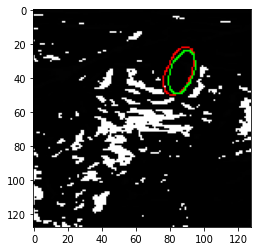

tf.Tensor(0.82443833, shape=(), dtype=float32)


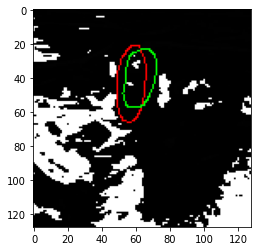

tf.Tensor(0.6205928, shape=(), dtype=float32)


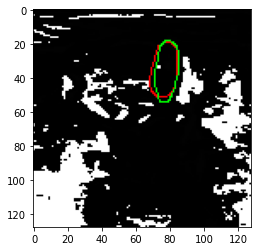

tf.Tensor(0.85808605, shape=(), dtype=float32)


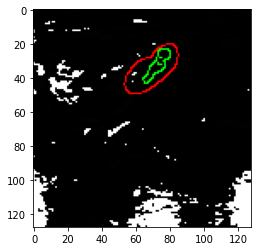

tf.Tensor(0.33357847, shape=(), dtype=float32)


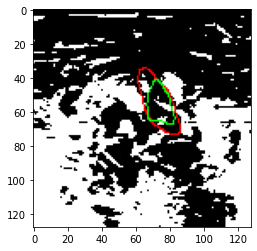

tf.Tensor(0.6884792, shape=(), dtype=float32)


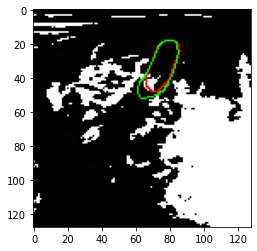

tf.Tensor(0.8543148, shape=(), dtype=float32)


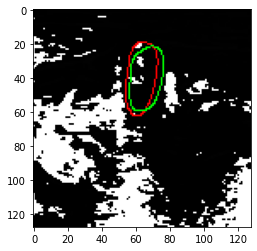

tf.Tensor(0.7834456, shape=(), dtype=float32)


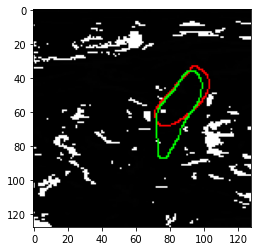

tf.Tensor(0.7382333, shape=(), dtype=float32)


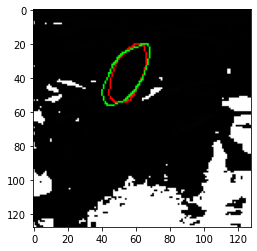

tf.Tensor(0.86901325, shape=(), dtype=float32)


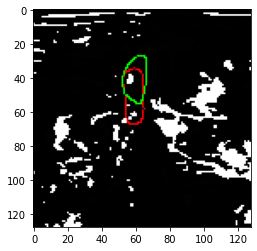

tf.Tensor(0.6139361, shape=(), dtype=float32)


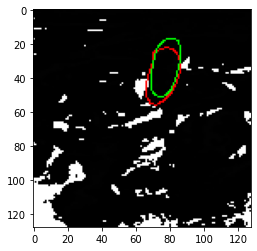

tf.Tensor(0.78862816, shape=(), dtype=float32)


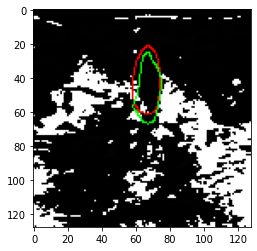

tf.Tensor(0.7708677, shape=(), dtype=float32)


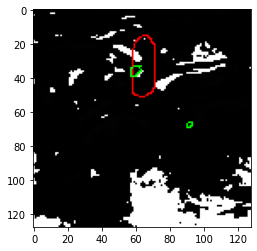

tf.Tensor(0.089943886, shape=(), dtype=float32)


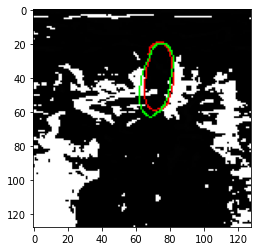

tf.Tensor(0.8577882, shape=(), dtype=float32)


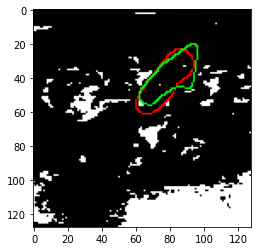

tf.Tensor(0.7780341, shape=(), dtype=float32)


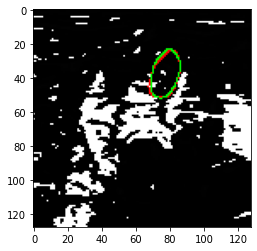

tf.Tensor(0.9185327, shape=(), dtype=float32)


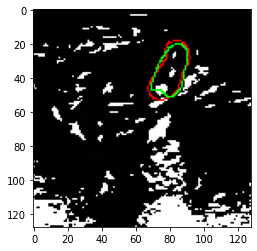

tf.Tensor(0.8517956, shape=(), dtype=float32)


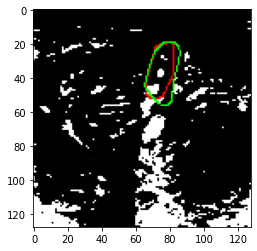

tf.Tensor(0.82357705, shape=(), dtype=float32)


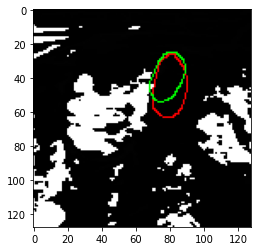

tf.Tensor(0.71146846, shape=(), dtype=float32)


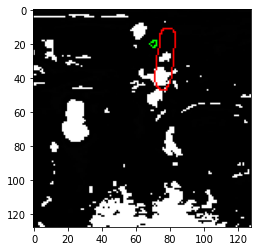

tf.Tensor(0.0032242294, shape=(), dtype=float32)


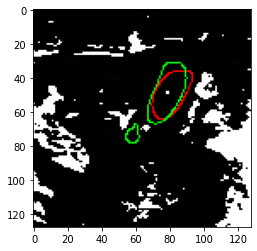

tf.Tensor(0.73126984, shape=(), dtype=float32)


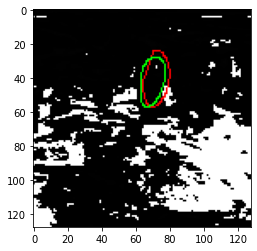

tf.Tensor(0.76103616, shape=(), dtype=float32)


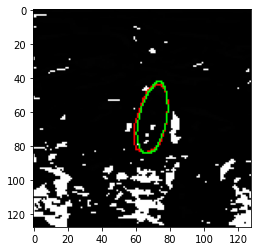

tf.Tensor(0.9222339, shape=(), dtype=float32)


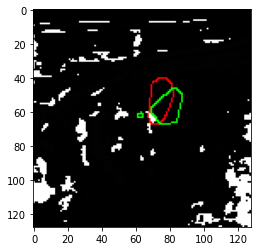

tf.Tensor(0.46379176, shape=(), dtype=float32)


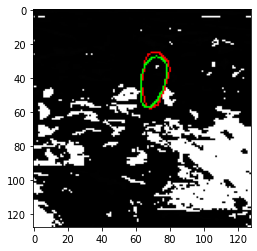

tf.Tensor(0.85723335, shape=(), dtype=float32)


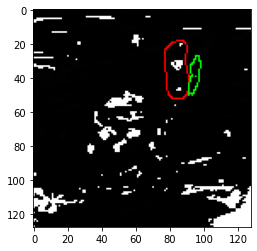

tf.Tensor(0.011482967, shape=(), dtype=float32)


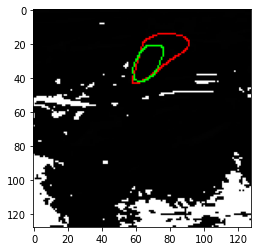

tf.Tensor(0.6209787, shape=(), dtype=float32)


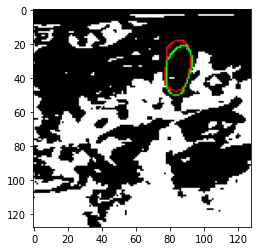

tf.Tensor(0.8464367, shape=(), dtype=float32)


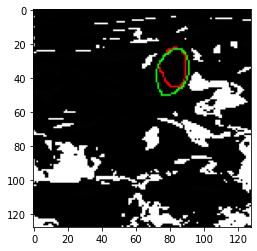

tf.Tensor(0.7896903, shape=(), dtype=float32)


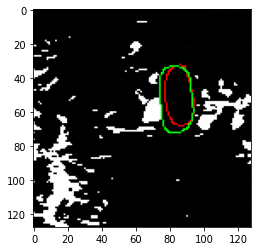

tf.Tensor(0.8159409, shape=(), dtype=float32)


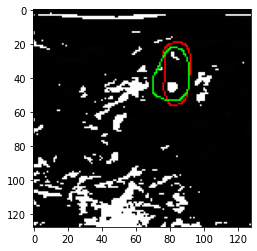

tf.Tensor(0.7666383, shape=(), dtype=float32)


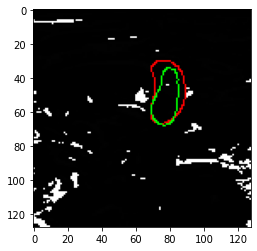

tf.Tensor(0.7445618, shape=(), dtype=float32)


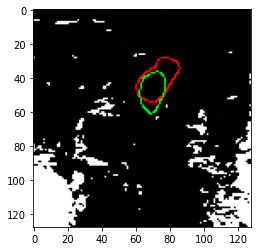

tf.Tensor(0.6131159, shape=(), dtype=float32)


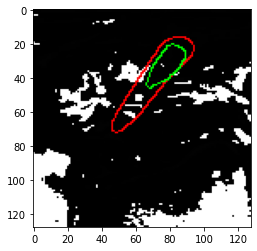

tf.Tensor(0.50820076, shape=(), dtype=float32)


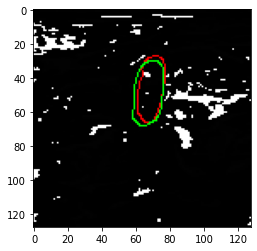

tf.Tensor(0.84648085, shape=(), dtype=float32)


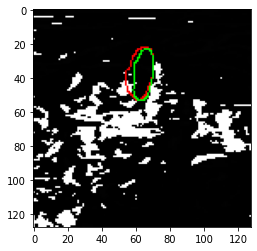

tf.Tensor(0.79762983, shape=(), dtype=float32)


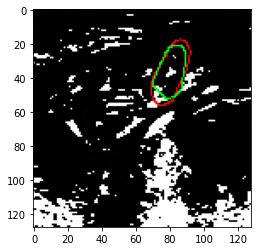

tf.Tensor(0.83019394, shape=(), dtype=float32)


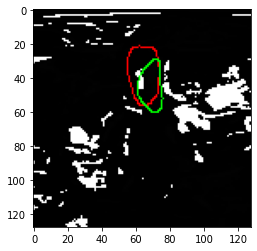

tf.Tensor(0.5736508, shape=(), dtype=float32)


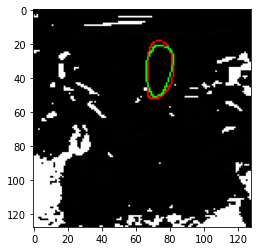

tf.Tensor(0.8705173, shape=(), dtype=float32)


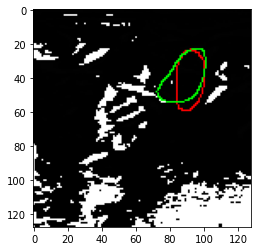

tf.Tensor(0.73096734, shape=(), dtype=float32)


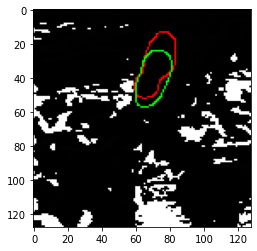

tf.Tensor(0.70533854, shape=(), dtype=float32)


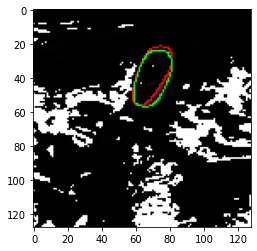

tf.Tensor(0.8773152, shape=(), dtype=float32)


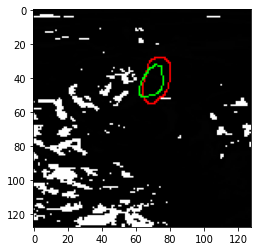

tf.Tensor(0.6480008, shape=(), dtype=float32)


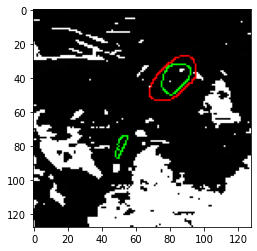

tf.Tensor(0.5956093, shape=(), dtype=float32)


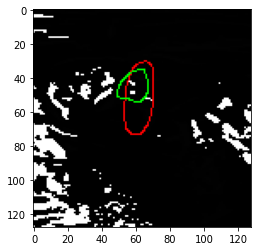

tf.Tensor(0.47384727, shape=(), dtype=float32)


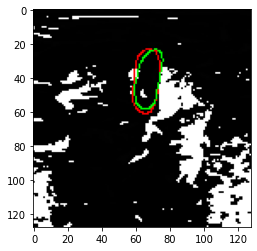

tf.Tensor(0.8555965, shape=(), dtype=float32)


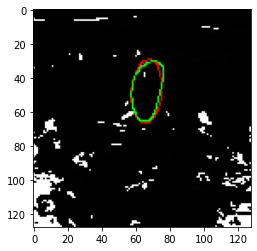

tf.Tensor(0.9157074, shape=(), dtype=float32)


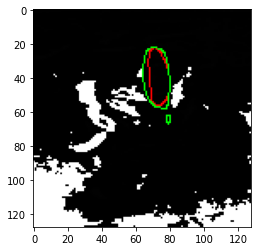

tf.Tensor(0.8161755, shape=(), dtype=float32)


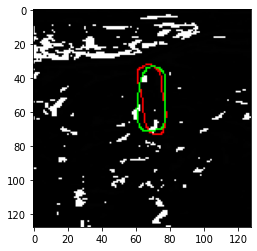

tf.Tensor(0.8224174, shape=(), dtype=float32)


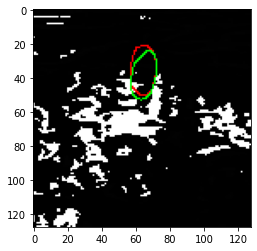

tf.Tensor(0.8427721, shape=(), dtype=float32)


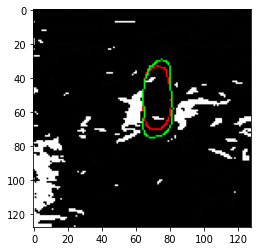

tf.Tensor(0.8561103, shape=(), dtype=float32)


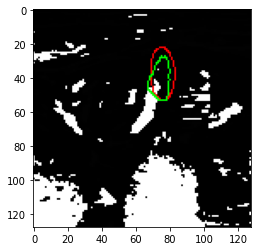

tf.Tensor(0.7121768, shape=(), dtype=float32)


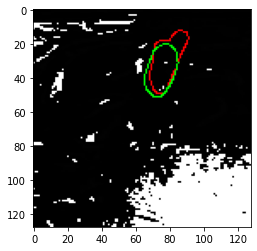

tf.Tensor(0.746004, shape=(), dtype=float32)


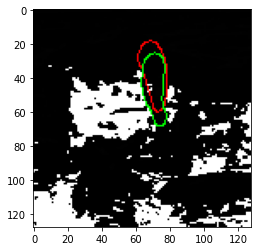

tf.Tensor(0.66757953, shape=(), dtype=float32)


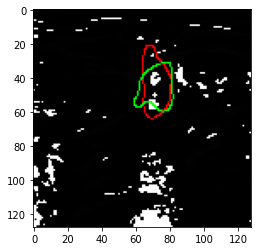

tf.Tensor(0.6994124, shape=(), dtype=float32)


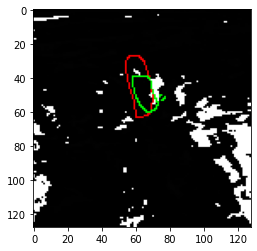

tf.Tensor(0.6022279, shape=(), dtype=float32)


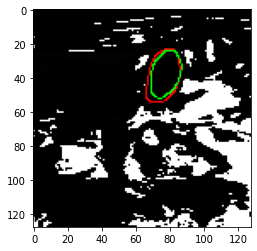

tf.Tensor(0.8521299, shape=(), dtype=float32)


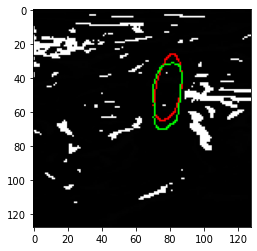

tf.Tensor(0.8386925, shape=(), dtype=float32)


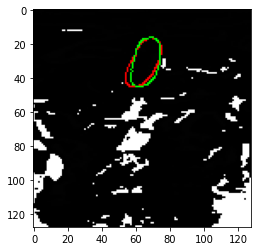

tf.Tensor(0.8769344, shape=(), dtype=float32)


In [ ]:
# Trained with only masked/ segmented images. Displaying 100 validation images with the original mask and predicted.

for i in np.arange(100):
    
    pred_img=np.asarray(initial_model.predict(np.asarray(imgs_validation_initial_model[i].reshape( 1, 128,128,1  )))).reshape(128,128,1)
    pred_mask=((pred_img[:,:,0]*255.).astype(np.uint8))
    
    real_mask=((imgs_mask_validation_initial_model[i][:,:,0]*255.).astype(np.uint8))

    real_image=((imgs_validation_initial_model[i][:,:,0]).astype(np.uint8))

    image_with_real_mask=image_with_mask(real_image, real_mask)

    imshow(image_with_mask1(image_with_real_mask, pred_mask))

    show()

    
    


    print(dice_coef( (imgs_mask_validation_initial_model[i]),  (pred_img) ))
    


    
    


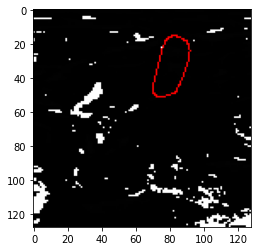

tf.Tensor(0.0019116945, shape=(), dtype=float32)


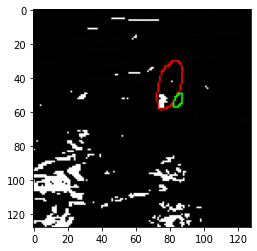

tf.Tensor(0.0107293045, shape=(), dtype=float32)


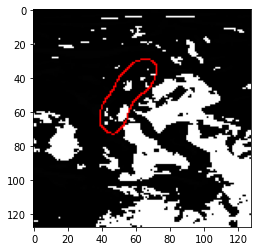

tf.Tensor(0.001392762, shape=(), dtype=float32)


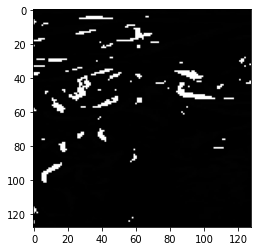

tf.Tensor(0.9989681, shape=(), dtype=float32)


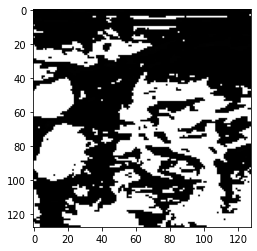

tf.Tensor(0.98643875, shape=(), dtype=float32)


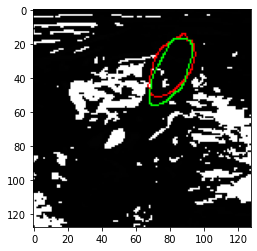

tf.Tensor(0.8438702, shape=(), dtype=float32)


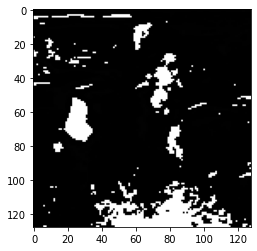

tf.Tensor(0.99435014, shape=(), dtype=float32)


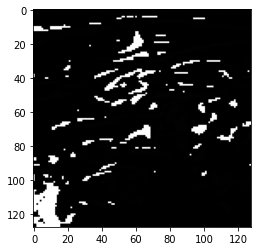

tf.Tensor(0.9663317, shape=(), dtype=float32)


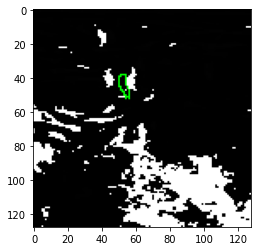

tf.Tensor(0.022246063, shape=(), dtype=float32)


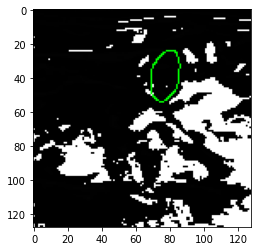

tf.Tensor(0.0025348233, shape=(), dtype=float32)


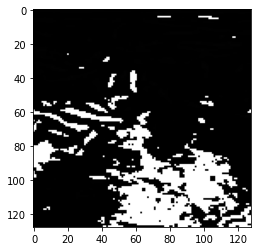

tf.Tensor(0.9914765, shape=(), dtype=float32)


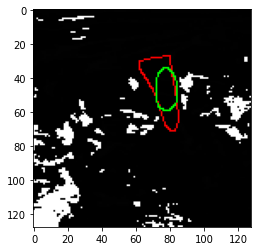

tf.Tensor(0.5873386, shape=(), dtype=float32)


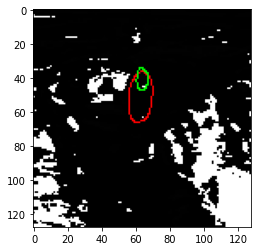

tf.Tensor(0.310215, shape=(), dtype=float32)


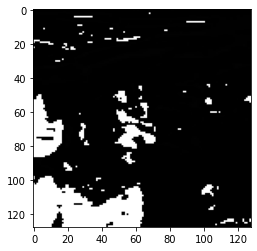

tf.Tensor(0.99490994, shape=(), dtype=float32)


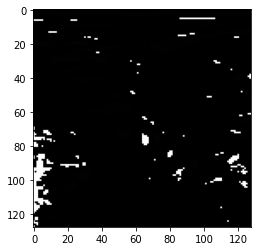

tf.Tensor(0.998928, shape=(), dtype=float32)


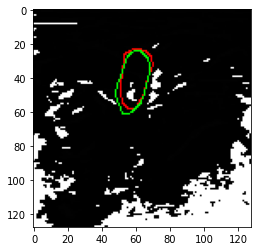

tf.Tensor(0.8721682, shape=(), dtype=float32)


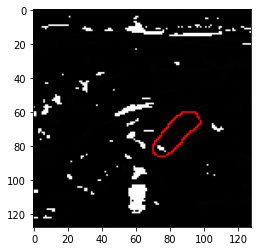

tf.Tensor(0.0027357792, shape=(), dtype=float32)


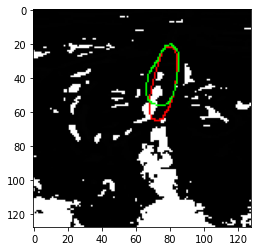

tf.Tensor(0.80533624, shape=(), dtype=float32)


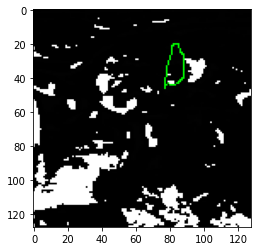

tf.Tensor(0.004976087, shape=(), dtype=float32)


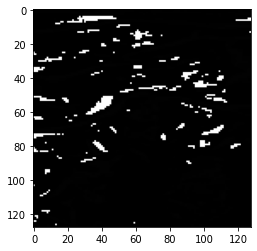

tf.Tensor(0.998955, shape=(), dtype=float32)


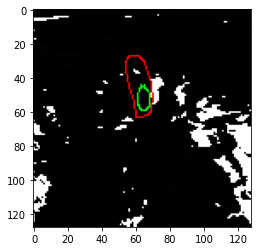

tf.Tensor(0.35057706, shape=(), dtype=float32)


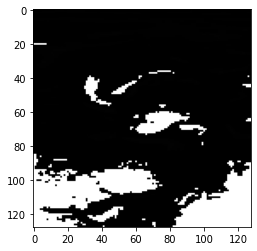

tf.Tensor(0.99942565, shape=(), dtype=float32)


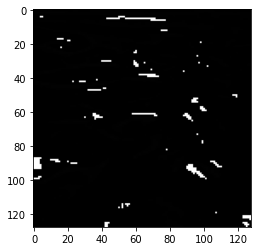

tf.Tensor(0.99379927, shape=(), dtype=float32)


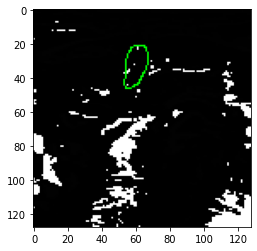

tf.Tensor(0.0038855297, shape=(), dtype=float32)


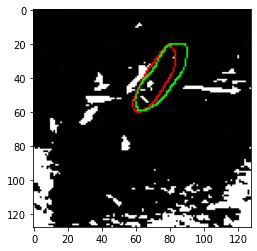

tf.Tensor(0.7598898, shape=(), dtype=float32)


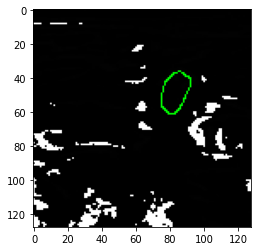

tf.Tensor(0.0033938969, shape=(), dtype=float32)


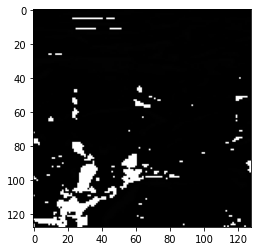

tf.Tensor(0.99770254, shape=(), dtype=float32)


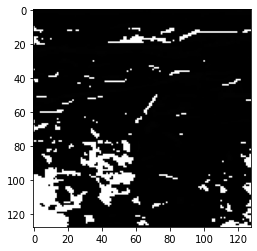

tf.Tensor(0.43828866, shape=(), dtype=float32)


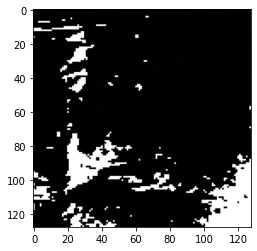

tf.Tensor(0.99873215, shape=(), dtype=float32)


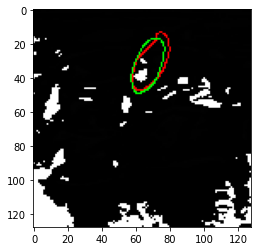

tf.Tensor(0.8340553, shape=(), dtype=float32)


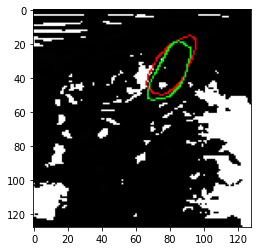

tf.Tensor(0.8214767, shape=(), dtype=float32)


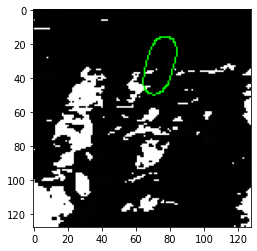

tf.Tensor(0.0021087464, shape=(), dtype=float32)


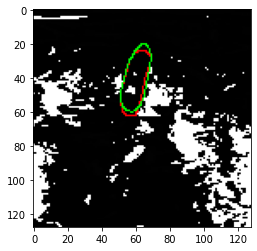

tf.Tensor(0.88692385, shape=(), dtype=float32)


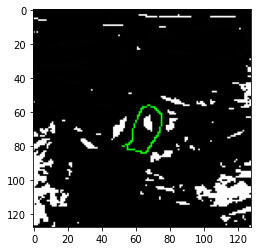

tf.Tensor(0.002853557, shape=(), dtype=float32)


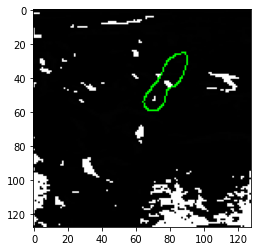

tf.Tensor(0.0026120017, shape=(), dtype=float32)


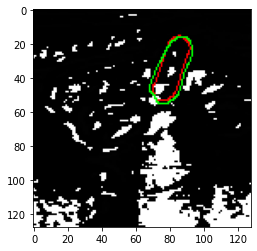

tf.Tensor(0.85724634, shape=(), dtype=float32)


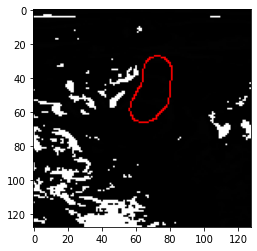

tf.Tensor(0.0015398936, shape=(), dtype=float32)


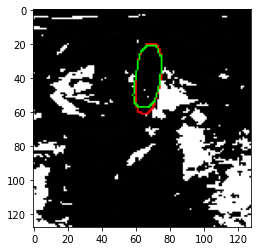

tf.Tensor(0.91312975, shape=(), dtype=float32)


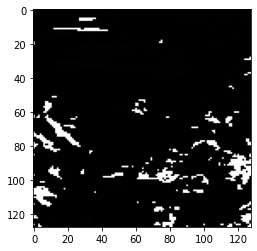

tf.Tensor(0.9985991, shape=(), dtype=float32)


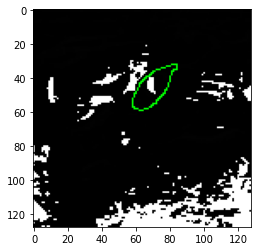

tf.Tensor(0.0028195174, shape=(), dtype=float32)


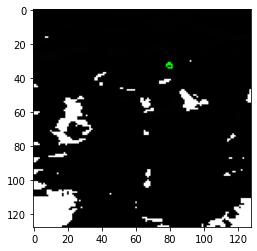

tf.Tensor(0.121856, shape=(), dtype=float32)


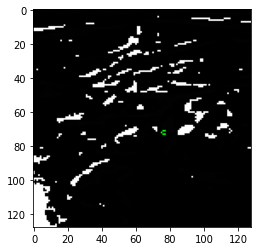

tf.Tensor(0.2559225, shape=(), dtype=float32)


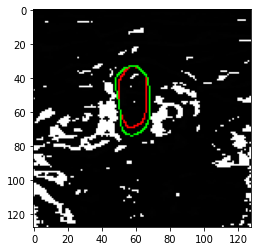

tf.Tensor(0.8482211, shape=(), dtype=float32)


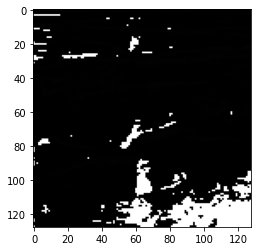

tf.Tensor(0.99906546, shape=(), dtype=float32)


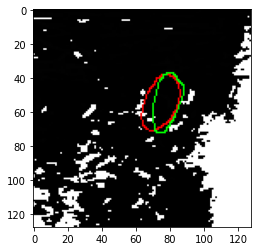

tf.Tensor(0.7481322, shape=(), dtype=float32)


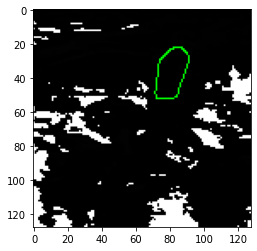

tf.Tensor(0.0023663654, shape=(), dtype=float32)


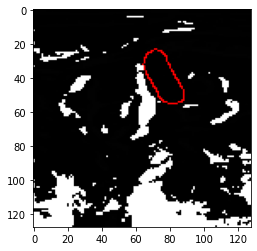

tf.Tensor(0.0022906624, shape=(), dtype=float32)


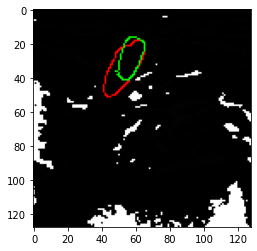

tf.Tensor(0.67922235, shape=(), dtype=float32)


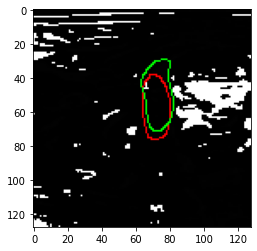

tf.Tensor(0.7339709, shape=(), dtype=float32)


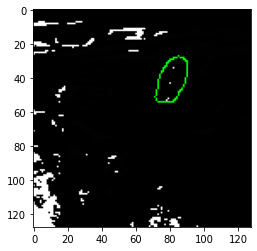

tf.Tensor(0.0028283603, shape=(), dtype=float32)


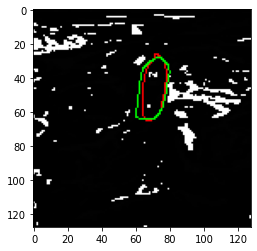

tf.Tensor(0.85606843, shape=(), dtype=float32)


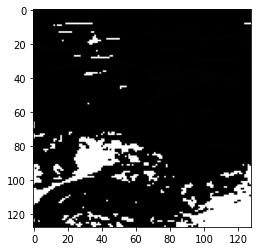

tf.Tensor(0.9993938, shape=(), dtype=float32)


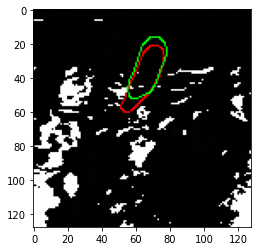

tf.Tensor(0.78768134, shape=(), dtype=float32)


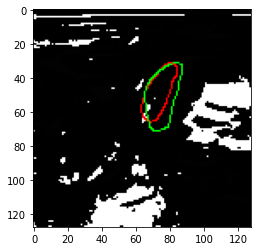

tf.Tensor(0.74147886, shape=(), dtype=float32)


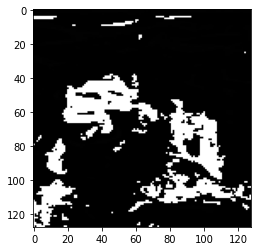

tf.Tensor(0.9942808, shape=(), dtype=float32)


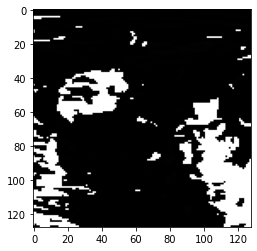

tf.Tensor(0.9981786, shape=(), dtype=float32)


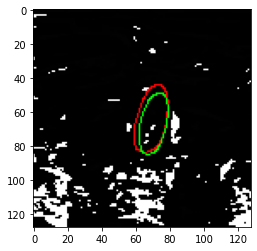

tf.Tensor(0.825213, shape=(), dtype=float32)


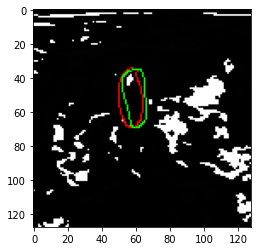

tf.Tensor(0.7380411, shape=(), dtype=float32)


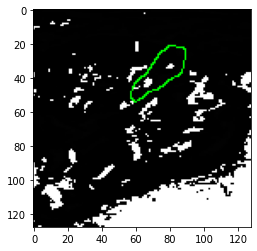

tf.Tensor(0.0020431876, shape=(), dtype=float32)


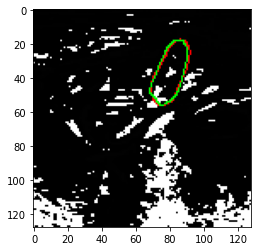

tf.Tensor(0.9275603, shape=(), dtype=float32)


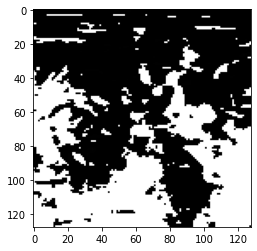

tf.Tensor(0.9661144, shape=(), dtype=float32)


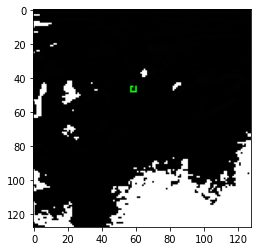

tf.Tensor(0.17776507, shape=(), dtype=float32)


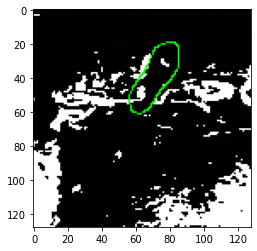

tf.Tensor(0.0015458472, shape=(), dtype=float32)


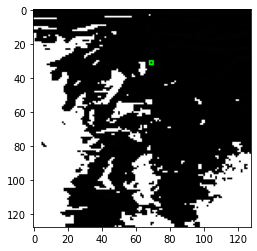

tf.Tensor(0.20330693, shape=(), dtype=float32)


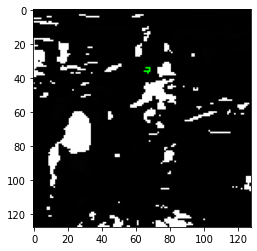

tf.Tensor(0.34106377, shape=(), dtype=float32)


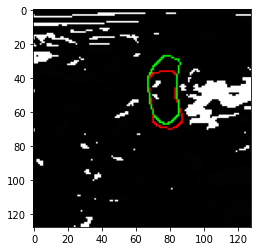

tf.Tensor(0.79614353, shape=(), dtype=float32)


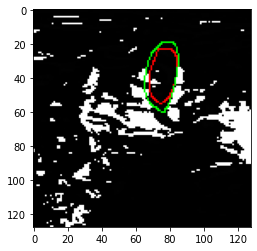

tf.Tensor(0.80679816, shape=(), dtype=float32)


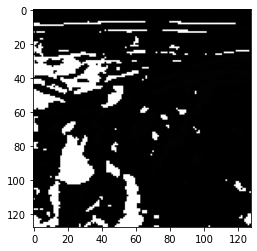

tf.Tensor(0.99768746, shape=(), dtype=float32)


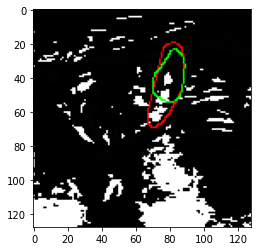

tf.Tensor(0.72654396, shape=(), dtype=float32)


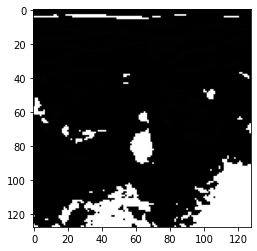

tf.Tensor(0.9979175, shape=(), dtype=float32)


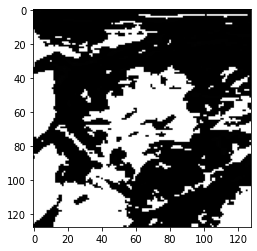

tf.Tensor(0.98716056, shape=(), dtype=float32)


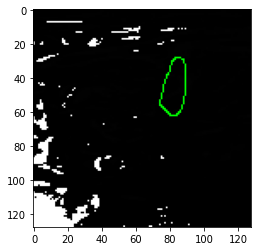

tf.Tensor(0.0027238955, shape=(), dtype=float32)


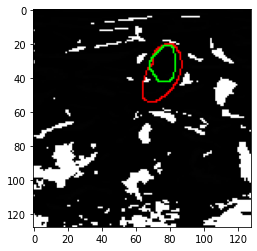

tf.Tensor(0.6139018, shape=(), dtype=float32)


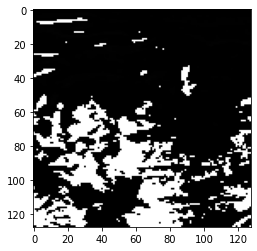

tf.Tensor(0.96781486, shape=(), dtype=float32)


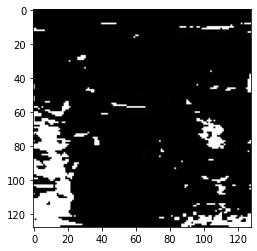

tf.Tensor(0.99859613, shape=(), dtype=float32)


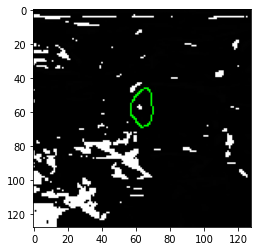

tf.Tensor(0.004640115, shape=(), dtype=float32)


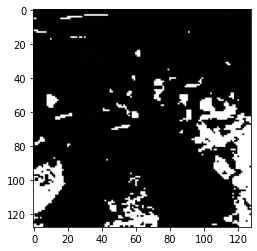

tf.Tensor(0.9778414, shape=(), dtype=float32)


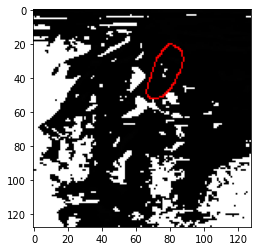

tf.Tensor(0.0023911817, shape=(), dtype=float32)


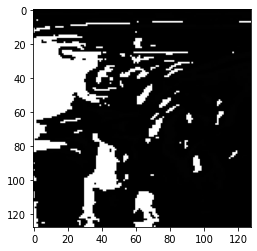

tf.Tensor(0.9915275, shape=(), dtype=float32)


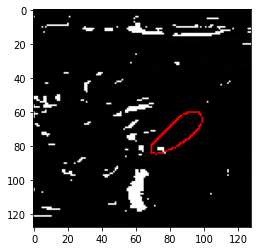

tf.Tensor(0.0027191816, shape=(), dtype=float32)


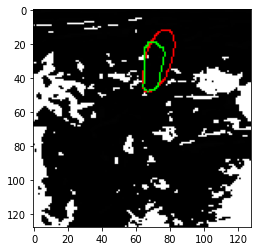

tf.Tensor(0.6851044, shape=(), dtype=float32)


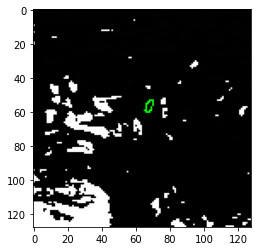

tf.Tensor(0.04517684, shape=(), dtype=float32)


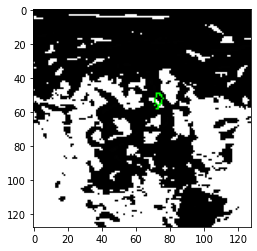

tf.Tensor(0.033530183, shape=(), dtype=float32)


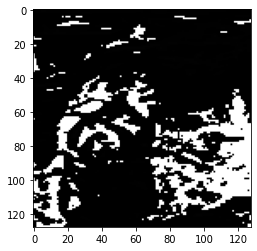

tf.Tensor(0.9979336, shape=(), dtype=float32)


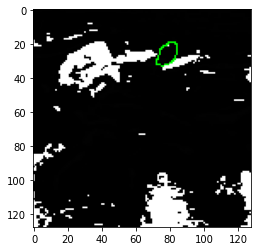

tf.Tensor(0.008302771, shape=(), dtype=float32)


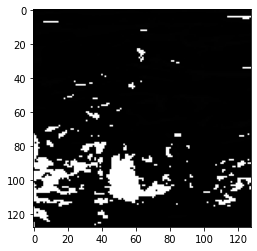

tf.Tensor(0.9966815, shape=(), dtype=float32)


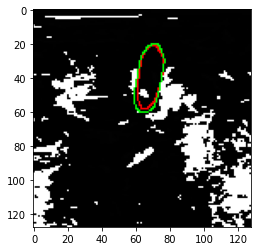

tf.Tensor(0.89499825, shape=(), dtype=float32)


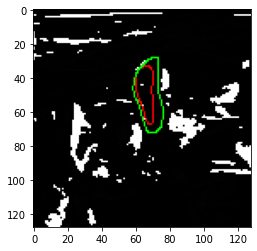

tf.Tensor(0.6511362, shape=(), dtype=float32)


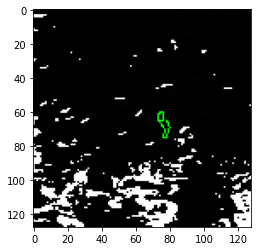

tf.Tensor(0.03635561, shape=(), dtype=float32)


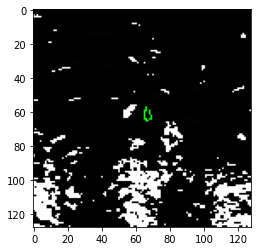

tf.Tensor(0.040693015, shape=(), dtype=float32)


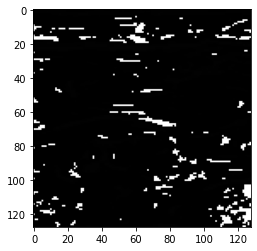

tf.Tensor(0.9988102, shape=(), dtype=float32)


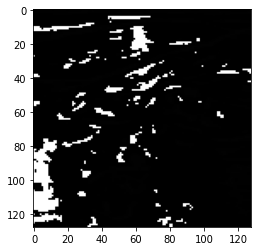

tf.Tensor(0.99887866, shape=(), dtype=float32)


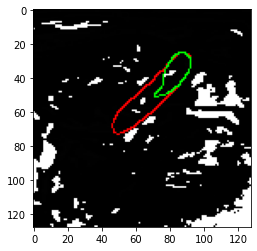

tf.Tensor(0.50814587, shape=(), dtype=float32)


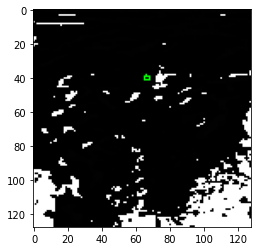

tf.Tensor(0.15670362, shape=(), dtype=float32)


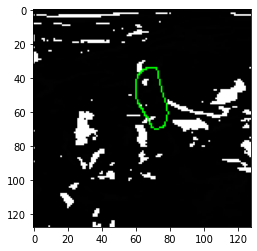

tf.Tensor(0.0021534606, shape=(), dtype=float32)


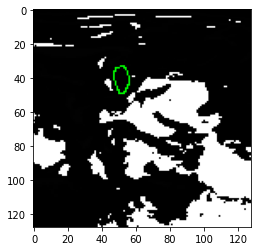

tf.Tensor(0.009109633, shape=(), dtype=float32)


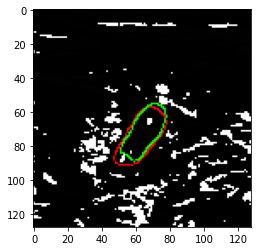

tf.Tensor(0.84786785, shape=(), dtype=float32)


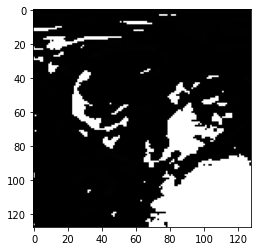

tf.Tensor(0.9850664, shape=(), dtype=float32)


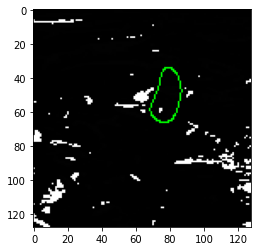

tf.Tensor(0.0024886236, shape=(), dtype=float32)


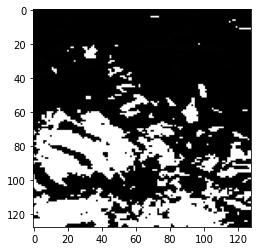

tf.Tensor(0.9978502, shape=(), dtype=float32)


In [ ]:
for i in np.arange(100):
    
    pred_img=np.asarray(initial_model.predict(np.asarray(imgs_validation_initial_model[i].reshape( 1, 128,128,1  )))).reshape(128,128,1)
    pred_mask=((pred_img[:,:,0]*255.).astype(np.uint8))
    
    real_mask=((imgs_mask_validation_initial_model[i][:,:,0]*255.).astype(np.uint8))

    real_image=((imgs_validation_initial_model[i][:,:,0]).astype(np.uint8))

    image_with_real_mask=image_with_mask(real_image, real_mask)

    imshow(image_with_mask1(image_with_real_mask, pred_mask))

    show()

    
    


    print(dice_coef( (imgs_mask_validation_initial_model[i]),  (pred_img) ))
    


    
    


# <h1> Double UNET

In [15]:
tf.keras.backend.clear_session()
tf.config.experimental_run_functions_eagerly(True)
def vgg_net(inputs):
    '''
    Encoder1 of the architecture which uses
    the pretrained VGG-19 architecture
    '''
    vgg_19_model=VGG19(include_top=False, weights='imagenet', input_tensor=inputs)

    #We need to take 4 layers which need to be passed to the decoder1
    layer_outputs=[]
    layers=[

        "block1_conv2",  #output shape 64
        "block2_conv2",  #output shape 128
        "block3_conv4",  #output shape 256
        "block4_conv4"   #output shape 512 

        ]
    
    for layer in layers:
        layer_outputs.append(vgg_19_model.get_layer(layer).output)  #output of these layers act as input to the decoder architecuture in network1

    return vgg_19_model.get_layer("block5_conv4").output, layer_outputs #final layer of the VGG19 with output shape 512
    
    


#Altrous Spatial pyramid pooling   
#Reference: https://arxiv.org/pdf/1606.00915v2.pdf  
def ASPP(input):
    ''' ASPP is a semantic segmentation module for resampling a given feature layer at multiple rates prior to convolution. 
     This amounts to probing the original image with multiple filters that have complementary effective fields of view, thus 
     capturing objects as well as useful image context at multiple scales. Rather than actually resampling features, 
     the mapping is implemented using multiple parallel atrous convolutional layers with different sampling rates. '''

    shape=input.shape #(#,#,512 shape)


    a= Conv2D(filters=64, kernel_size=3, dilation_rate=6, padding="same")(input)
    a=BatchNormalization()(a)
    a=Activation("relu")(a)

    b= Conv2D(filters=64, kernel_size=3, dilation_rate=12, padding="same")(input)
    b=BatchNormalization()(b)
    b=Activation("relu")(b)

    c= Conv2D(filters=64, kernel_size=3, dilation_rate=18, padding="same")(input)
    c=BatchNormalization()(c)
    c=Activation("relu")(c)

    d= Conv2D(filters=64, kernel_size=3, dilation_rate=24, padding="same")(input)
    d=BatchNormalization()(d)
    d=Activation("relu")(d)

    x= Concatenate()([a,b,c,d])

    x = Conv2D(64, 3, dilation_rate=1, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x




def decoder1( input, layer_outputs):
    ''' function to take inputs from output of ASPP and the last 4 layer outputs of VGG19 and Upsample to return the output '''

    filters=[256,128,64,32]
    layer_outputs.reverse()

    x=input

    for index, filter in enumerate(filters):
        x=UpSampling2D((2,2), interpolation='bilinear')(x) #Each block in the decoder performs a 2 × 2 bi-linear up-sampling on the input feature
        x= Concatenate()([x,  layer_outputs[index]]) # concatenate the appropriate skip connections feature maps from the encoder to the output feature maps
        # After concatenation, we again perform two 3 × 3 convolution operation, each of which is followed by batch normalization and then by a ReLU activation function

        x= Conv2D (filter, (3,3), padding='same')(x)

 
        x= BatchNormalization()(x)
        x = Activation ('relu')(x)

        x= Conv2D(filter, (3,3), padding='same')(x)
        x= BatchNormalization()(x)
        x = Activation ('relu')(x)

        #After that, we use a squeeze and excitation block. At last, we apply a convolution layer with a sigmoid activation function, which is used to generate the mask for the corresponding modified U-Net.

        #Ref: https://towardsdatascience.com/squeeze-and-excitation-networks-9ef5e71eacd7
        ch= x.shape[-1] # getting the last channel
        sq_ex= GlobalAveragePooling2D()(x)
        sq_ex = Dense(ch // 16, activation='relu')(sq_ex)
        sq_ex = Dense(ch, activation='sigmoid')(sq_ex)

        x= Multiply()([x, sq_ex])

    return x


def output_block_network(inputs):
    x=Conv2D(filters=1, kernel_size=(1,1), padding="same")(inputs) #filter =1 to generate the grey scale mask initially
    x= Activation("sigmoid")(x)
    return x



def encoder2(inputs):

    filters=[256,128,64,32]  #reverse of decoder1

    layer_outputs=[]

    x=inputs

    for index, filter in enumerate(filters):
        #Each encoder block in the encoder2 performs two 3 × 3 convolution operation, each followed by a batch normalization
        x= Conv2D (filter, (3,3), padding='same')(x)
        x= BatchNormalization()(x)
        x = Activation ('relu')(x)

        layer_outputs.append(x)

        

        x = MaxPool2D((2, 2))(x)

    return x, layer_outputs


def decoder2(inputs, layer_outputs_encoder1, layer_outputs_encoder2):
    #Here we will only revers the output from the encoder2 not the encoder1. Encoder1 is parallely ppassed as input to the layers of Decoder2.

    filters=[256,128,64,32]
    layer_outputs_encoder2.reverse()

    x= inputs

    for index, filter in enumerate(filters):
        x=UpSampling2D((2,2), interpolation='bilinear')(x) #Each block in the decoder performs a 2 × 2 bi-linear up-sampling on the input feature
        x= Concatenate()([x,  layer_outputs_encoder1[index], layer_outputs_encoder2[index] ]) # concatenate the appropriate skip connections feature maps from the encoder to the output feature maps
        # After concatenation, we again perform two 3 × 3 convolution operation, each of which is followed by batch normalization and then by a ReLU activation function

        x= Conv2D (filter, (3,3), padding='same')(x)

 
        x= BatchNormalization()(x)
        x = Activation ('relu')(x)

        x= Conv2D(filter, (3,3), padding='same')(x)
        x= BatchNormalization()(x)
        x = Activation ('relu')(x)

        #After that, we use a squeeze and excitation block. At last, we apply a convolution layer with a sigmoid activation function, which is used to generate the mask for the corresponding modified U-Net.

        #Ref: https://towardsdatascience.com/squeeze-and-excitation-networks-9ef5e71eacd7
        ch= x.shape[-1] # getting the last channel
        sq_ex= GlobalAveragePooling2D()(x)
        sq_ex = Dense(ch // 16, activation='relu')(sq_ex)
        sq_ex = Dense(ch, activation='sigmoid')(sq_ex)

        x= Multiply()([x, sq_ex])

    return x








img_rows=96
img_cols=96
#NETWORK 1
inputs=Input((img_rows,img_cols,3))
x, layer_outputs_encoder1= vgg_net(inputs)
x= ASPP(x)
x= decoder1(x, layer_outputs_encoder1)
output_network1= output_block_network(x) #Now input shapes match the output of the Network1.  i.e ( img_row, img_cols, 1)


#NETWORK 2
#Output from the previous output will be passed by Multiplying with the input of Network1

x= Multiply()([inputs, output_network1])
x, layer_outputs_encoder2 = encoder2(x)
x= ASPP(x)
x= decoder2(x, layer_outputs_encoder1, layer_outputs_encoder2)
output_network2= output_block_network(x)

print(output_network2.shape) #Now input shapes match the output of the Network2.  i.e ( img_row, img_cols, 1)

# CONCATENATING OUTPUT FROM NETWORK1 AND NETWORK2
outputs = tf.maximum(output_network1, output_network2)
#tf.keras.layers.Add()([output_network1, output_network2])  #Now  output will be  i.e ( img_row, img_cols, 2)



#Double_UNET = Model(inputs=[inputs], outputs=[outputs])

Double_UNET= Model(inputs, outputs)

Double_UNET.summary()




(None, 96, 96, 1)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 96, 96, 64)   1792        input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 96, 96, 64)   36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, 48, 48, 64)   0           block1_conv2[0][0]               
____________________________________________________________________________

In [32]:
import datetime

#ultra_son_images=np.load('ultrasonic_images_data_with_segmentation.npy')
#ultra_son_masks= np.load('ultrasonic_masks_data_with_segmentation.npy')


#print("loading images and masks completed....")

imgs= preprocess_images(ultra_son_images)
imgs_mask = preprocess(ultra_son_masks)

print("Preprocessing for Double U-net model is done for both images and masks..")

imgs_train_doubleunet, imgs_mask_train_doubleunet, imgs_validation_doubleunet, imgs_mask_validation_doubleunet= train_validation_split(imgs, imgs_mask)

Preprocessing for Double U-net model is done for both images and masks..


In [63]:
print(imgs_train_doubleunet.shape)
print(imgs_mask_train_doubleunet.shape)
print(imgs_validation_doubleunet.shape)
print(imgs_mask_validation_doubleunet.shape)


(2000, 96, 96, 3)
(2000, 96, 96, 1)
(323, 96, 96, 3)
(323, 96, 96, 1)


In [67]:
#tensorboard

Double_UNET.compile(optimizer=Adam(lr=0.0001), loss=dice_loss, metrics=[dice_coef])
!rm -r logs_double_unet*

log_dir="logs_double_unet\\fit\\" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True,write_grads=True)

model_checkpoint = ModelCheckpoint('Double_UNET_model_weights.h5', monitor='val_loss', save_best_only=True)

callback_list = [tensorboard_callback,model_checkpoint]

Double_UNET.fit(x=imgs_train_doubleunet, y=imgs_mask_train_doubleunet, batch_size=32, epochs=45, verbose=1, shuffle=True,
              validation_data= [imgs_validation_doubleunet, imgs_mask_validation_doubleunet],
              callbacks=callback_list)

Train on 2000 samples, validate on 323 samples
Epoch 1/45
2000/2000 [==============================] - 34s 17ms/sample - loss: 0.9172 - dice_coef: 0.0830 - val_loss: 0.9186 - val_dice_coef: 0.0820
Epoch 2/45
2000/2000 [==============================] - 33s 16ms/sample - loss: 0.8757 - dice_coef: 0.1244 - val_loss: 0.9099 - val_dice_coef: 0.0911
Epoch 3/45
2000/2000 [==============================] - 33s 16ms/sample - loss: 0.8608 - dice_coef: 0.1393 - val_loss: 0.8748 - val_dice_coef: 0.1263
Epoch 4/45
2000/2000 [==============================] - 33s 17ms/sample - loss: 0.8532 - dice_coef: 0.1468 - val_loss: 0.8588 - val_dice_coef: 0.1426
Epoch 5/45
2000/2000 [==============================] - 33s 17ms/sample - loss: 0.8463 - dice_coef: 0.1538 - val_loss: 0.8492 - val_dice_coef: 0.1525
Epoch 6/45
2000/2000 [==============================] - 33s 17ms/sample - loss: 0.8401 - dice_coef: 0.1599 - val_loss: 0.8385 - val_dice_coef: 0.1634
Epoch 7/45
2000/2000 [==============================]

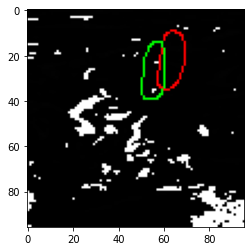

tf.Tensor(0.20106025, shape=(), dtype=float32)


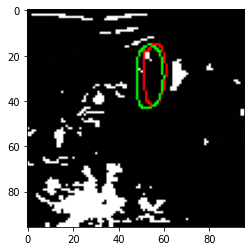

tf.Tensor(0.73102635, shape=(), dtype=float32)


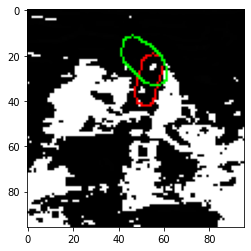

tf.Tensor(0.4528092, shape=(), dtype=float32)


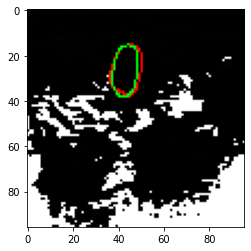

tf.Tensor(0.83941674, shape=(), dtype=float32)


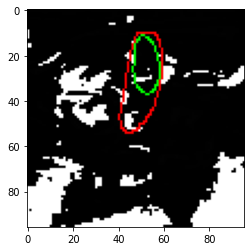

tf.Tensor(0.56142867, shape=(), dtype=float32)


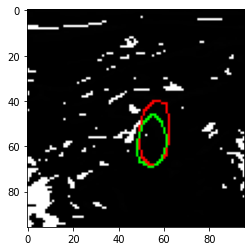

tf.Tensor(0.7432413, shape=(), dtype=float32)


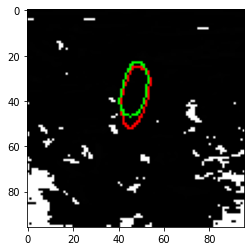

tf.Tensor(0.7764148, shape=(), dtype=float32)


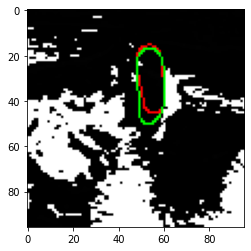

tf.Tensor(0.82641506, shape=(), dtype=float32)


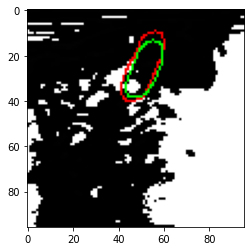

tf.Tensor(0.78960633, shape=(), dtype=float32)


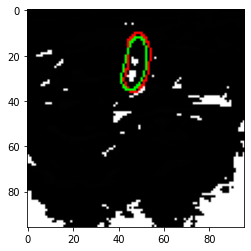

tf.Tensor(0.7616512, shape=(), dtype=float32)


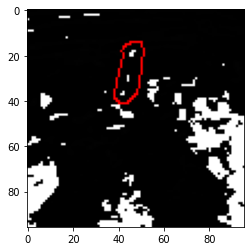

tf.Tensor(0.006498376, shape=(), dtype=float32)


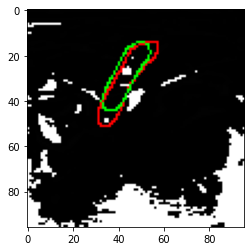

tf.Tensor(0.74141324, shape=(), dtype=float32)


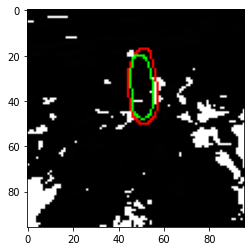

tf.Tensor(0.7677086, shape=(), dtype=float32)


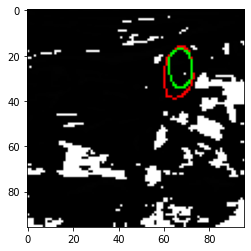

tf.Tensor(0.7349334, shape=(), dtype=float32)


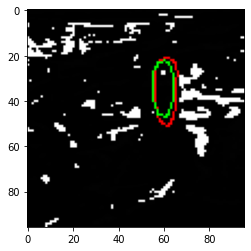

tf.Tensor(0.7710757, shape=(), dtype=float32)


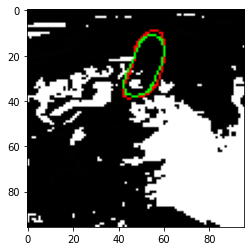

tf.Tensor(0.8715981, shape=(), dtype=float32)


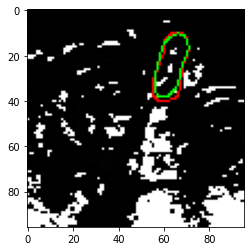

tf.Tensor(0.8627359, shape=(), dtype=float32)


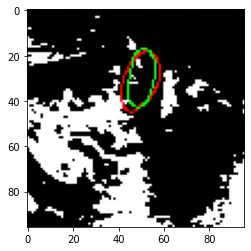

tf.Tensor(0.77231055, shape=(), dtype=float32)


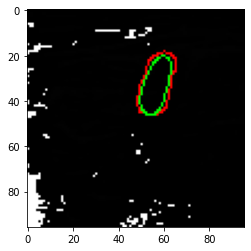

tf.Tensor(0.80541587, shape=(), dtype=float32)


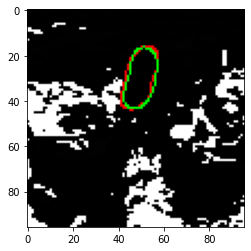

tf.Tensor(0.876356, shape=(), dtype=float32)


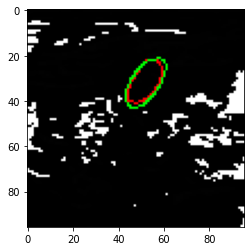

tf.Tensor(0.83233446, shape=(), dtype=float32)


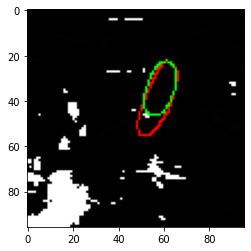

tf.Tensor(0.74271303, shape=(), dtype=float32)


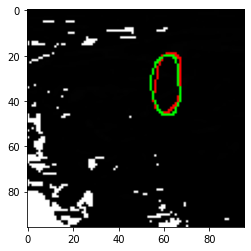

tf.Tensor(0.83259875, shape=(), dtype=float32)


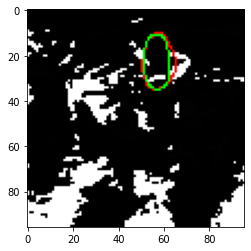

tf.Tensor(0.8434862, shape=(), dtype=float32)


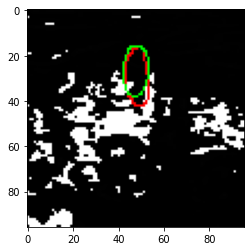

tf.Tensor(0.77638453, shape=(), dtype=float32)


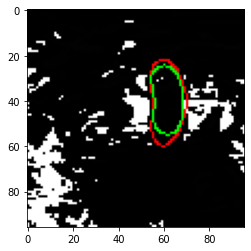

tf.Tensor(0.8345231, shape=(), dtype=float32)


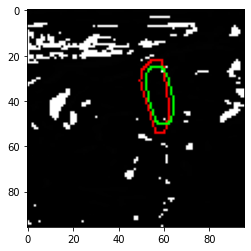

tf.Tensor(0.73617214, shape=(), dtype=float32)


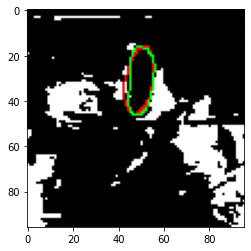

tf.Tensor(0.8525653, shape=(), dtype=float32)


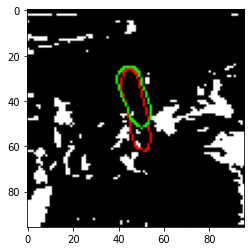

tf.Tensor(0.6921207, shape=(), dtype=float32)


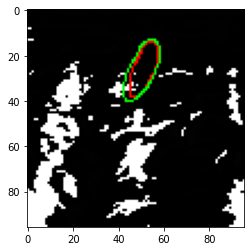

tf.Tensor(0.81449217, shape=(), dtype=float32)


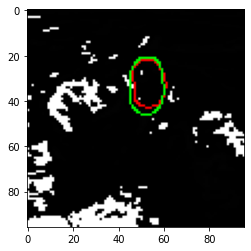

tf.Tensor(0.8254785, shape=(), dtype=float32)


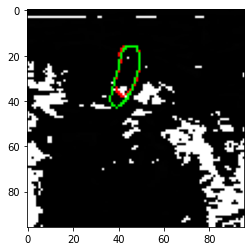

tf.Tensor(0.8076075, shape=(), dtype=float32)


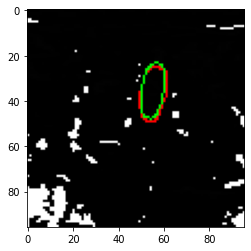

tf.Tensor(0.8393418, shape=(), dtype=float32)


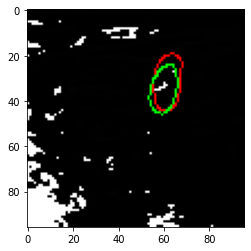

tf.Tensor(0.7239115, shape=(), dtype=float32)


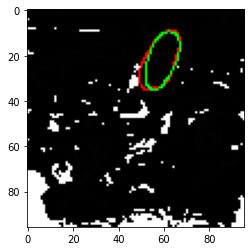

tf.Tensor(0.87117034, shape=(), dtype=float32)


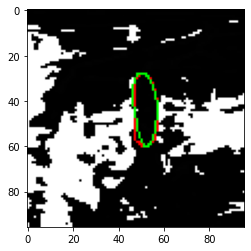

tf.Tensor(0.8850923, shape=(), dtype=float32)


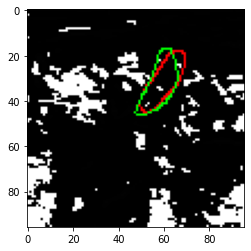

tf.Tensor(0.7599674, shape=(), dtype=float32)


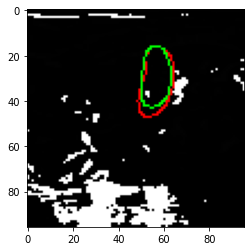

tf.Tensor(0.8202051, shape=(), dtype=float32)


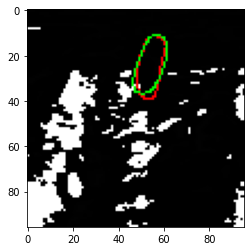

tf.Tensor(0.83967775, shape=(), dtype=float32)


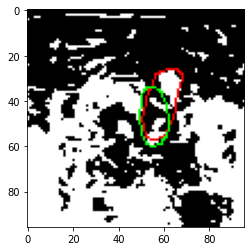

tf.Tensor(0.6250763, shape=(), dtype=float32)


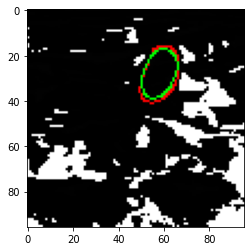

tf.Tensor(0.8480714, shape=(), dtype=float32)


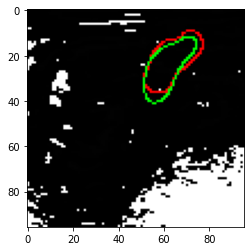

tf.Tensor(0.8007889, shape=(), dtype=float32)


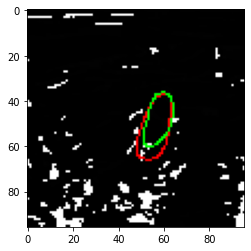

tf.Tensor(0.75336325, shape=(), dtype=float32)


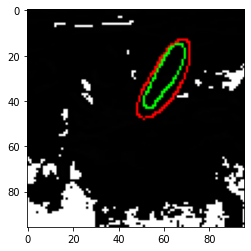

tf.Tensor(0.65610135, shape=(), dtype=float32)


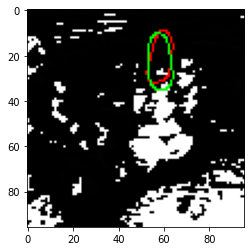

tf.Tensor(0.74647963, shape=(), dtype=float32)


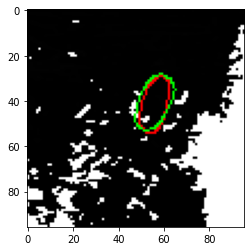

tf.Tensor(0.81077564, shape=(), dtype=float32)


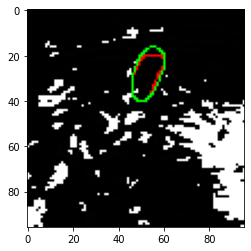

tf.Tensor(0.83817995, shape=(), dtype=float32)


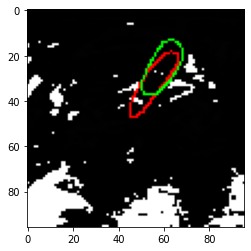

tf.Tensor(0.6434167, shape=(), dtype=float32)


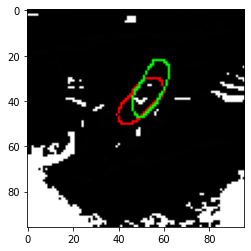

tf.Tensor(0.63236463, shape=(), dtype=float32)


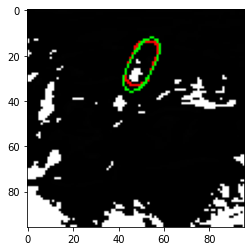

tf.Tensor(0.8534605, shape=(), dtype=float32)


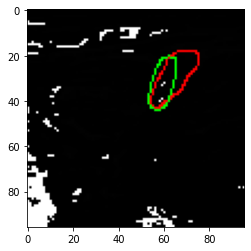

tf.Tensor(0.5773214, shape=(), dtype=float32)


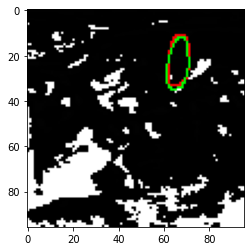

tf.Tensor(0.82156676, shape=(), dtype=float32)


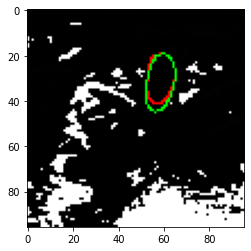

tf.Tensor(0.8525184, shape=(), dtype=float32)


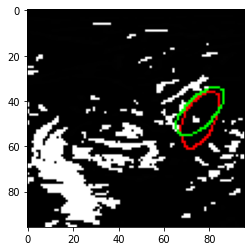

tf.Tensor(0.73545146, shape=(), dtype=float32)


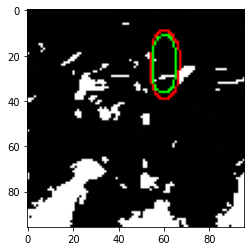

tf.Tensor(0.7955155, shape=(), dtype=float32)


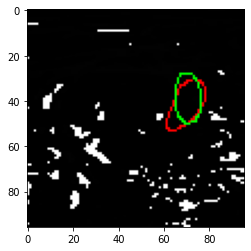

tf.Tensor(0.7071117, shape=(), dtype=float32)


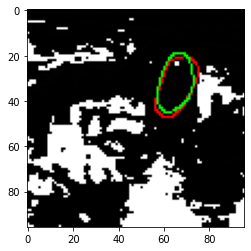

tf.Tensor(0.843653, shape=(), dtype=float32)


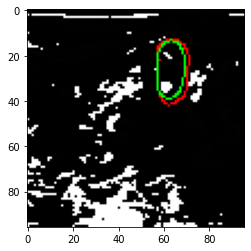

tf.Tensor(0.8312896, shape=(), dtype=float32)


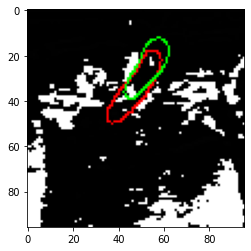

tf.Tensor(0.5948498, shape=(), dtype=float32)


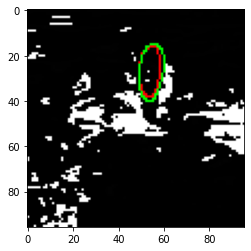

tf.Tensor(0.81644917, shape=(), dtype=float32)


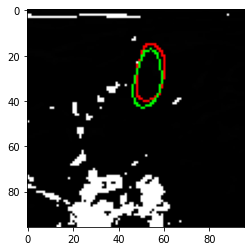

tf.Tensor(0.7890772, shape=(), dtype=float32)


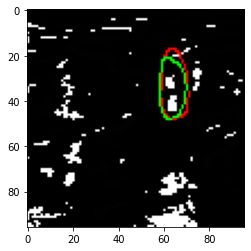

tf.Tensor(0.82522607, shape=(), dtype=float32)


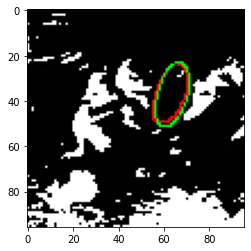

tf.Tensor(0.85199374, shape=(), dtype=float32)


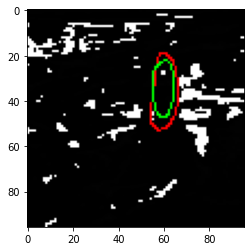

tf.Tensor(0.7014637, shape=(), dtype=float32)


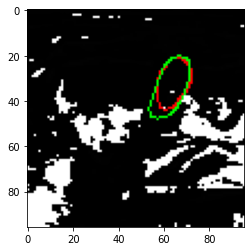

tf.Tensor(0.8138779, shape=(), dtype=float32)


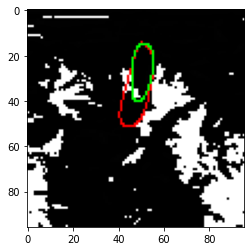

tf.Tensor(0.6709076, shape=(), dtype=float32)


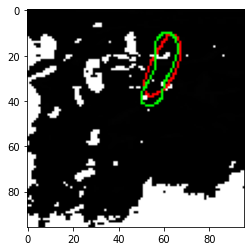

tf.Tensor(0.71844554, shape=(), dtype=float32)


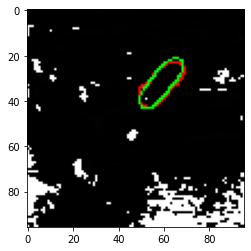

tf.Tensor(0.8564884, shape=(), dtype=float32)


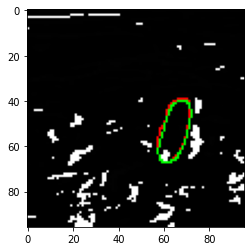

tf.Tensor(0.90206295, shape=(), dtype=float32)


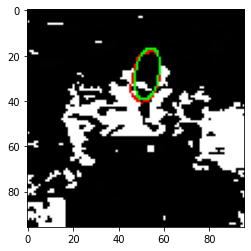

tf.Tensor(0.8515194, shape=(), dtype=float32)


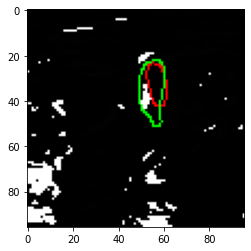

tf.Tensor(0.54509705, shape=(), dtype=float32)


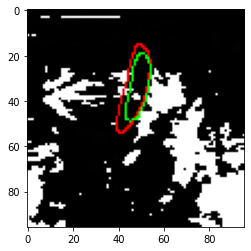

tf.Tensor(0.70300657, shape=(), dtype=float32)


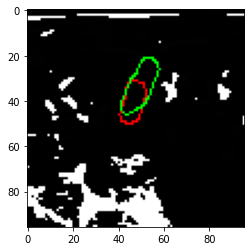

tf.Tensor(0.5510887, shape=(), dtype=float32)


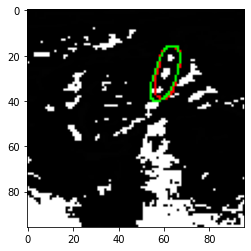

tf.Tensor(0.83222085, shape=(), dtype=float32)


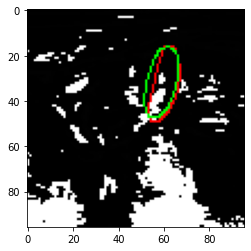

tf.Tensor(0.7902417, shape=(), dtype=float32)


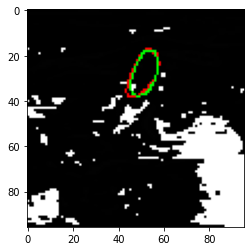

tf.Tensor(0.84540504, shape=(), dtype=float32)


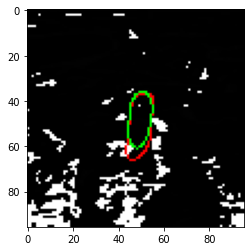

tf.Tensor(0.7979945, shape=(), dtype=float32)


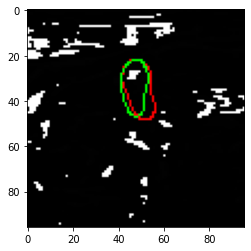

tf.Tensor(0.75446326, shape=(), dtype=float32)


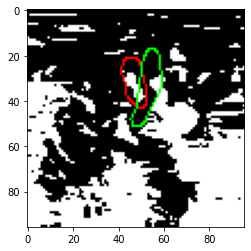

tf.Tensor(0.2008932, shape=(), dtype=float32)


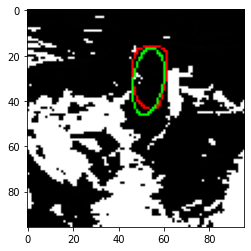

tf.Tensor(0.81503296, shape=(), dtype=float32)


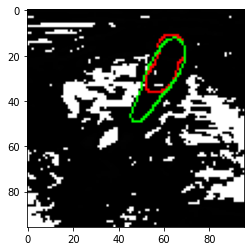

tf.Tensor(0.717117, shape=(), dtype=float32)


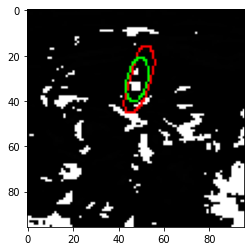

tf.Tensor(0.6463018, shape=(), dtype=float32)


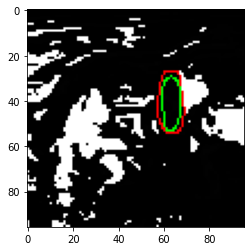

tf.Tensor(0.73700845, shape=(), dtype=float32)


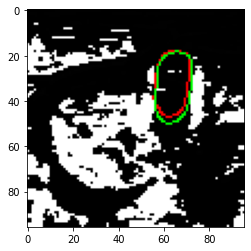

tf.Tensor(0.8682066, shape=(), dtype=float32)


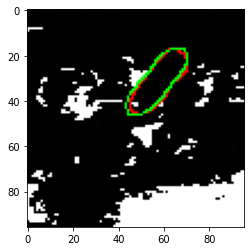

tf.Tensor(0.88879037, shape=(), dtype=float32)


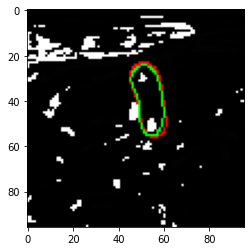

tf.Tensor(0.8861642, shape=(), dtype=float32)


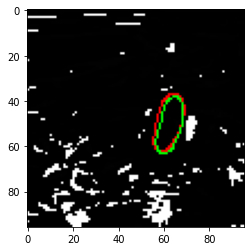

tf.Tensor(0.8304639, shape=(), dtype=float32)


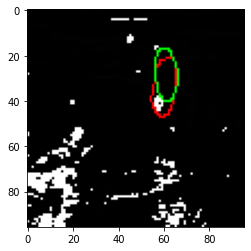

tf.Tensor(0.67678595, shape=(), dtype=float32)


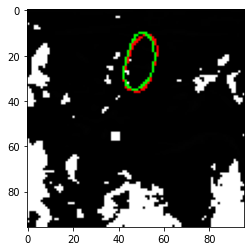

tf.Tensor(0.8684129, shape=(), dtype=float32)


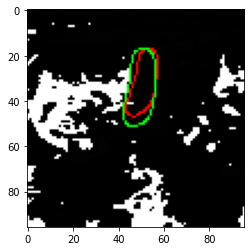

tf.Tensor(0.7655778, shape=(), dtype=float32)


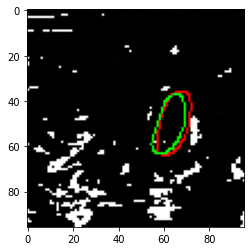

tf.Tensor(0.780603, shape=(), dtype=float32)


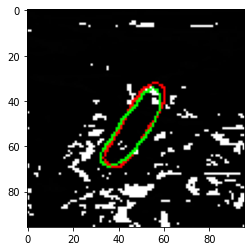

tf.Tensor(0.8578077, shape=(), dtype=float32)


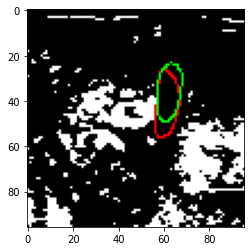

tf.Tensor(0.7290176, shape=(), dtype=float32)


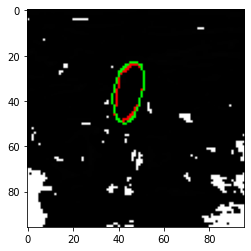

tf.Tensor(0.8628516, shape=(), dtype=float32)


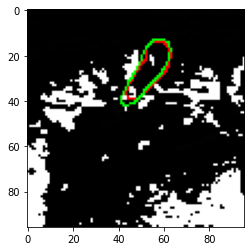

tf.Tensor(0.8517305, shape=(), dtype=float32)


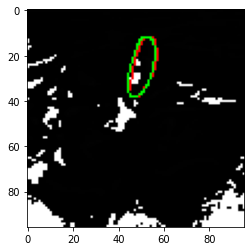

tf.Tensor(0.83754456, shape=(), dtype=float32)


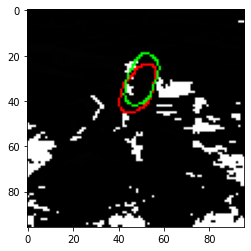

tf.Tensor(0.7225347, shape=(), dtype=float32)


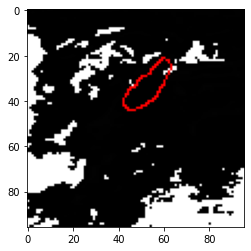

tf.Tensor(0.0070454404, shape=(), dtype=float32)


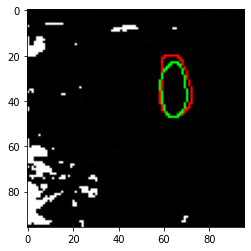

tf.Tensor(0.79638624, shape=(), dtype=float32)


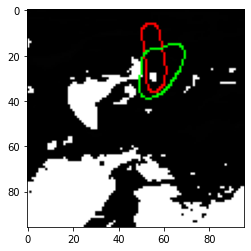

tf.Tensor(0.5051348, shape=(), dtype=float32)


In [36]:
# Trained with only masked/ segmented images. Displaying 100 validation images with the original mask and predicted.

for i in np.arange(100):
    
    pred_img=np.asarray(Double_UNET.predict(np.asarray(imgs_validation_doubleunet[i].reshape( 1, 96,96,3 )))).reshape(96,96,1)
    pred_mask=((pred_img[:,:,0]*255.).astype(np.uint8))
    
    real_mask=((imgs_mask_validation_doubleunet[i][:,:,0]*255.).astype(np.uint8))

    real_image=((imgs_validation_doubleunet[i][:,:,0]).astype(np.uint8))

    image_with_real_mask=image_with_mask(real_image, real_mask)

    imshow(image_with_mask1(image_with_real_mask, pred_mask))

    show()

    
    print(dice_coef( (imgs_mask_validation_doubleunet[i]),  (pred_img) ))
    


    
    


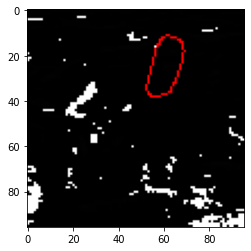

tf.Tensor(0.0036161805, shape=(), dtype=float32)


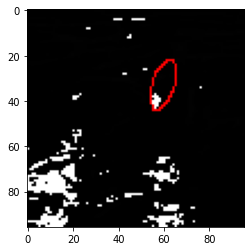

tf.Tensor(0.005980707, shape=(), dtype=float32)


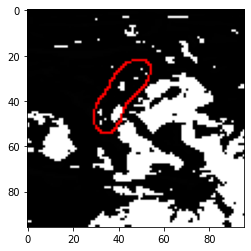

tf.Tensor(0.0026408683, shape=(), dtype=float32)


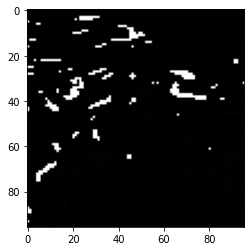

tf.Tensor(0.50716364, shape=(), dtype=float32)


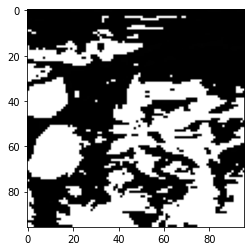

tf.Tensor(0.5872749, shape=(), dtype=float32)


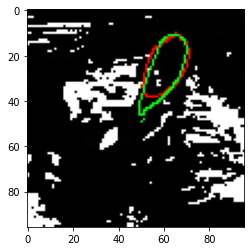

tf.Tensor(0.8385774, shape=(), dtype=float32)


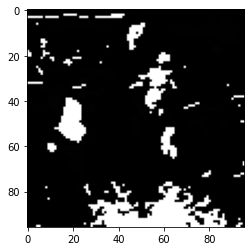

tf.Tensor(0.5666284, shape=(), dtype=float32)


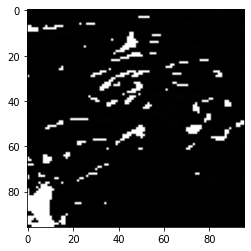

tf.Tensor(0.53916276, shape=(), dtype=float32)


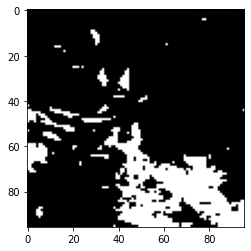

tf.Tensor(0.5681155, shape=(), dtype=float32)


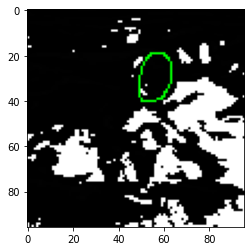

tf.Tensor(0.003958076, shape=(), dtype=float32)


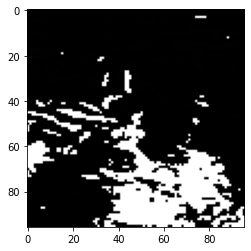

tf.Tensor(0.56982857, shape=(), dtype=float32)


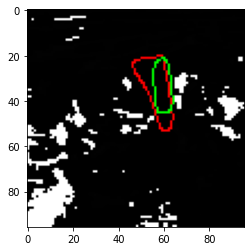

tf.Tensor(0.5926267, shape=(), dtype=float32)


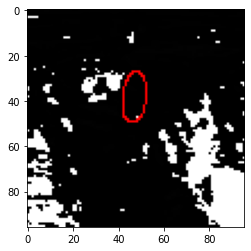

tf.Tensor(0.005604197, shape=(), dtype=float32)


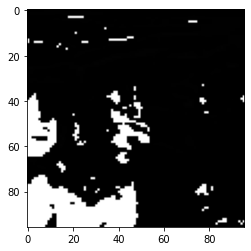

tf.Tensor(0.55635107, shape=(), dtype=float32)


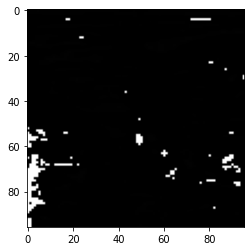

tf.Tensor(0.52990264, shape=(), dtype=float32)


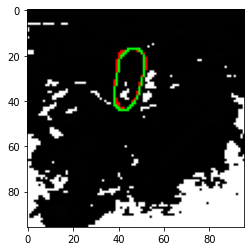

tf.Tensor(0.9161289, shape=(), dtype=float32)


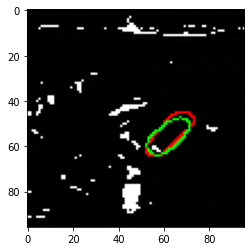

tf.Tensor(0.826947, shape=(), dtype=float32)


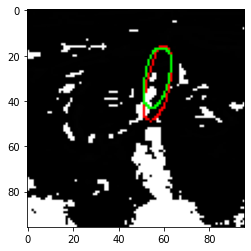

tf.Tensor(0.7982013, shape=(), dtype=float32)


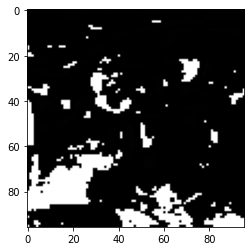

tf.Tensor(0.56462383, shape=(), dtype=float32)


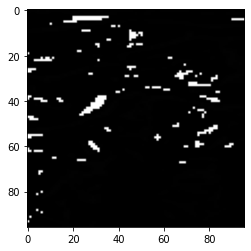

tf.Tensor(0.51228935, shape=(), dtype=float32)


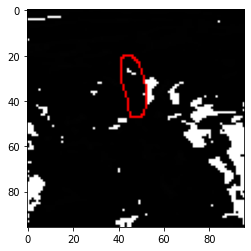

tf.Tensor(0.004623153, shape=(), dtype=float32)


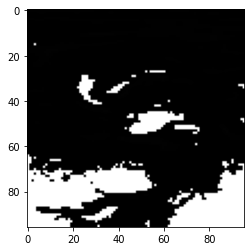

tf.Tensor(0.5597938, shape=(), dtype=float32)


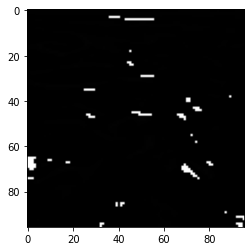

tf.Tensor(0.5256083, shape=(), dtype=float32)


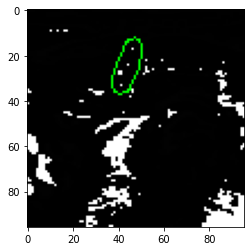

tf.Tensor(0.0048672105, shape=(), dtype=float32)


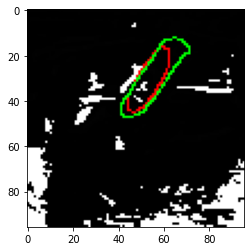

tf.Tensor(0.7381824, shape=(), dtype=float32)


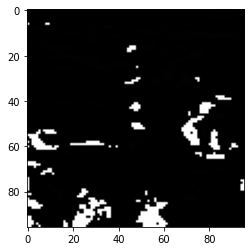

tf.Tensor(0.5376272, shape=(), dtype=float32)


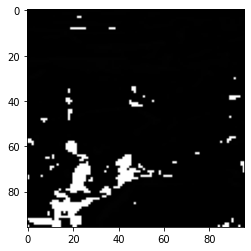

tf.Tensor(0.53790164, shape=(), dtype=float32)


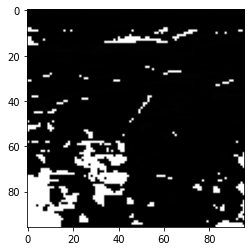

tf.Tensor(0.55893195, shape=(), dtype=float32)


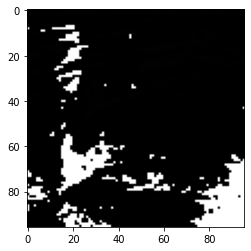

tf.Tensor(0.5515634, shape=(), dtype=float32)


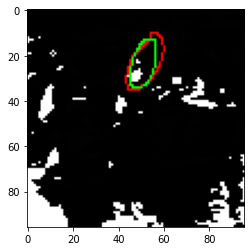

tf.Tensor(0.80222726, shape=(), dtype=float32)


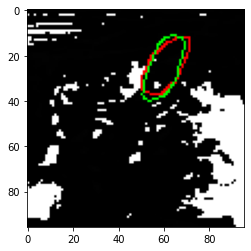

tf.Tensor(0.8367576, shape=(), dtype=float32)


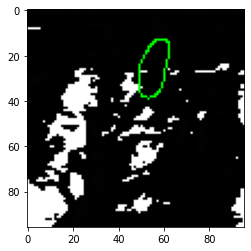

tf.Tensor(0.0038714039, shape=(), dtype=float32)


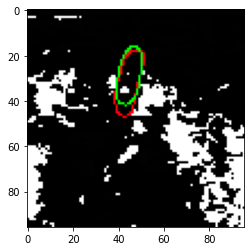

tf.Tensor(0.82733876, shape=(), dtype=float32)


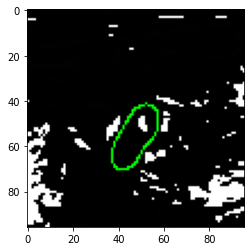

tf.Tensor(0.0027860533, shape=(), dtype=float32)


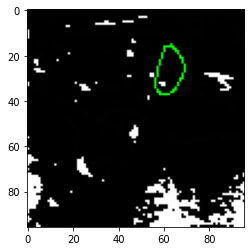

tf.Tensor(0.005119998, shape=(), dtype=float32)


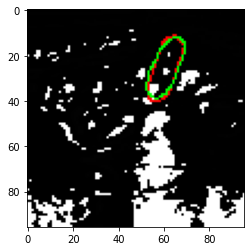

tf.Tensor(0.8921051, shape=(), dtype=float32)


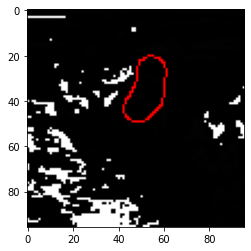

tf.Tensor(0.002956936, shape=(), dtype=float32)


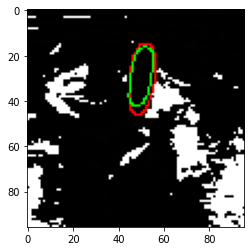

tf.Tensor(0.8305253, shape=(), dtype=float32)


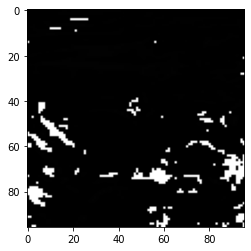

tf.Tensor(0.5373383, shape=(), dtype=float32)


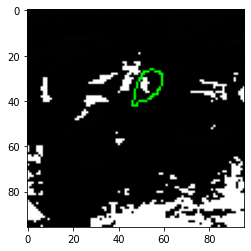

tf.Tensor(0.007791203, shape=(), dtype=float32)


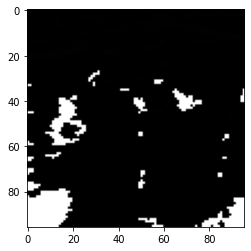

tf.Tensor(0.561592, shape=(), dtype=float32)


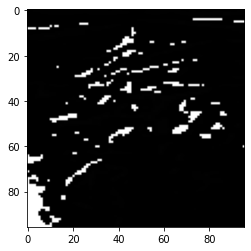

tf.Tensor(0.5385771, shape=(), dtype=float32)


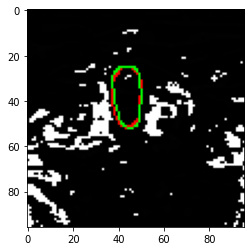

tf.Tensor(0.9084268, shape=(), dtype=float32)


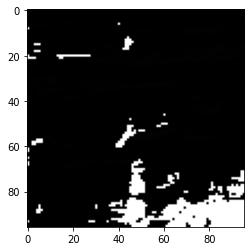

tf.Tensor(0.53776264, shape=(), dtype=float32)


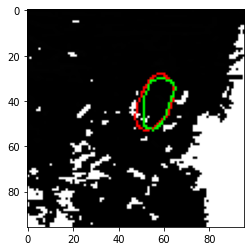

tf.Tensor(0.84144455, shape=(), dtype=float32)


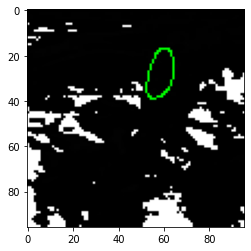

tf.Tensor(0.005091395, shape=(), dtype=float32)


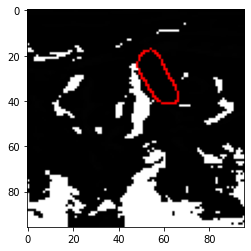

tf.Tensor(0.004232049, shape=(), dtype=float32)


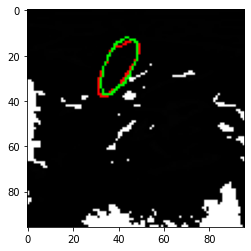

tf.Tensor(0.88886756, shape=(), dtype=float32)


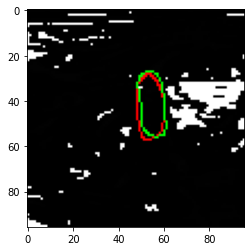

tf.Tensor(0.85491854, shape=(), dtype=float32)


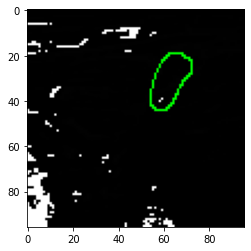

tf.Tensor(0.0033301122, shape=(), dtype=float32)


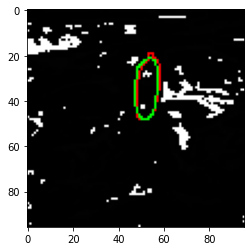

tf.Tensor(0.87958395, shape=(), dtype=float32)


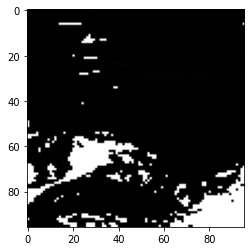

tf.Tensor(0.5422501, shape=(), dtype=float32)


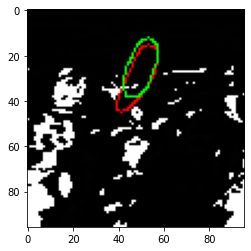

tf.Tensor(0.774334, shape=(), dtype=float32)


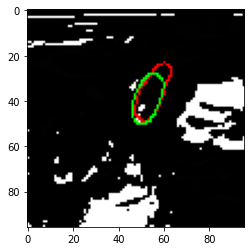

tf.Tensor(0.8052093, shape=(), dtype=float32)


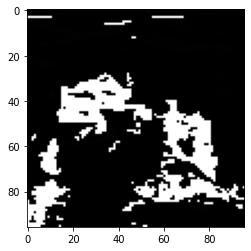

tf.Tensor(0.56816226, shape=(), dtype=float32)


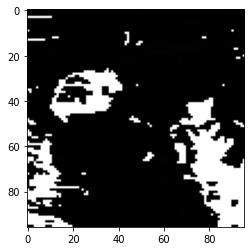

tf.Tensor(0.56777865, shape=(), dtype=float32)


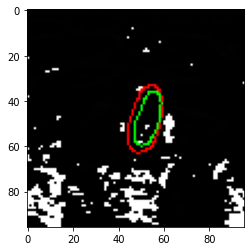

tf.Tensor(0.74122053, shape=(), dtype=float32)


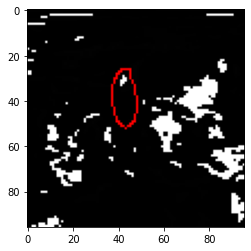

tf.Tensor(0.0049029035, shape=(), dtype=float32)


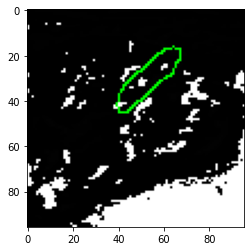

tf.Tensor(0.0030814016, shape=(), dtype=float32)


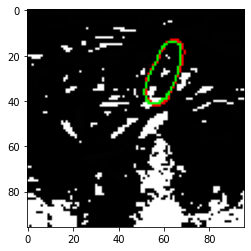

tf.Tensor(0.9194789, shape=(), dtype=float32)


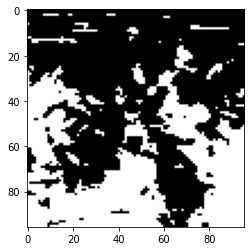

tf.Tensor(0.5893399, shape=(), dtype=float32)


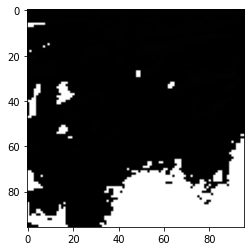

tf.Tensor(0.55853623, shape=(), dtype=float32)


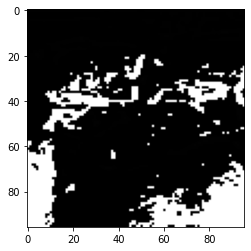

tf.Tensor(0.5735148, shape=(), dtype=float32)


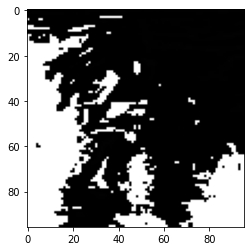

tf.Tensor(0.58449084, shape=(), dtype=float32)


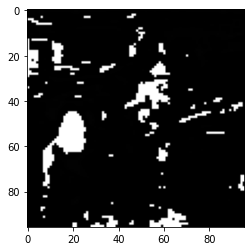

tf.Tensor(0.5722536, shape=(), dtype=float32)


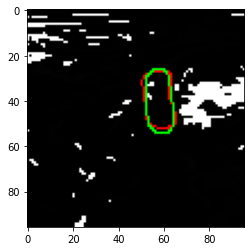

tf.Tensor(0.8935243, shape=(), dtype=float32)


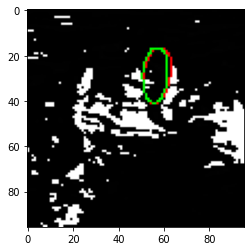

tf.Tensor(0.9001239, shape=(), dtype=float32)


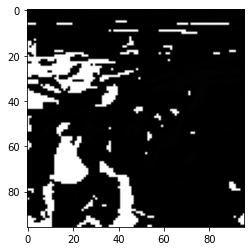

tf.Tensor(0.5611806, shape=(), dtype=float32)


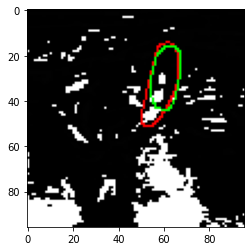

tf.Tensor(0.78234756, shape=(), dtype=float32)


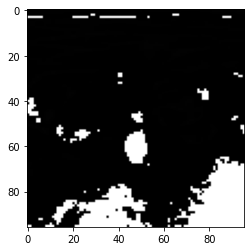

tf.Tensor(0.55060834, shape=(), dtype=float32)


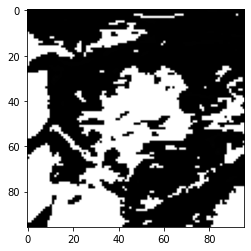

tf.Tensor(0.5806295, shape=(), dtype=float32)


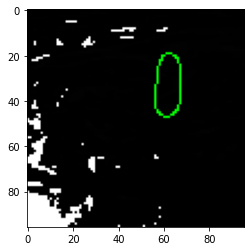

tf.Tensor(0.0037994531, shape=(), dtype=float32)


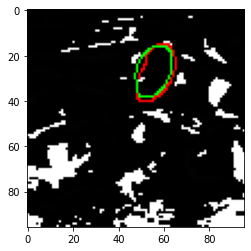

tf.Tensor(0.8475355, shape=(), dtype=float32)


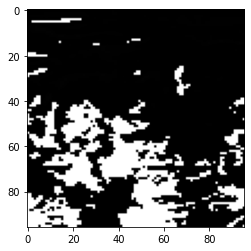

tf.Tensor(0.57361454, shape=(), dtype=float32)


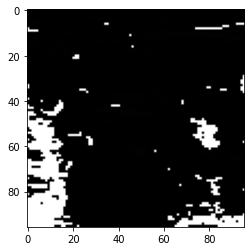

tf.Tensor(0.558043, shape=(), dtype=float32)


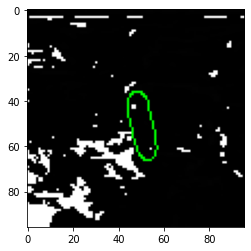

tf.Tensor(0.0037645947, shape=(), dtype=float32)


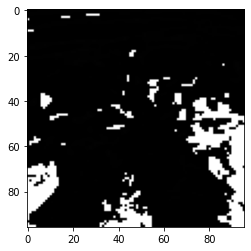

tf.Tensor(0.5460286, shape=(), dtype=float32)


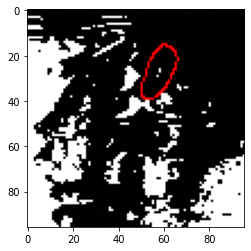

tf.Tensor(0.0043861815, shape=(), dtype=float32)


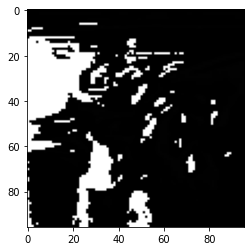

tf.Tensor(0.5673035, shape=(), dtype=float32)


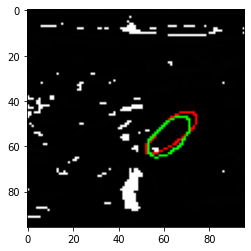

tf.Tensor(0.81176084, shape=(), dtype=float32)


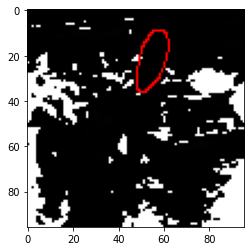

tf.Tensor(0.004064851, shape=(), dtype=float32)


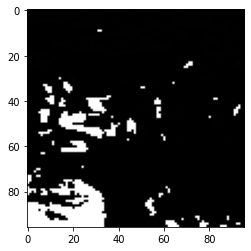

tf.Tensor(0.5550466, shape=(), dtype=float32)


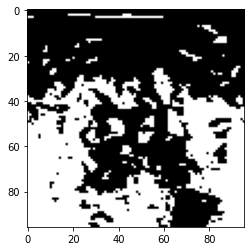

tf.Tensor(0.59080386, shape=(), dtype=float32)


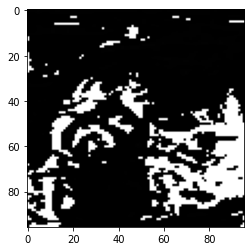

tf.Tensor(0.5702591, shape=(), dtype=float32)


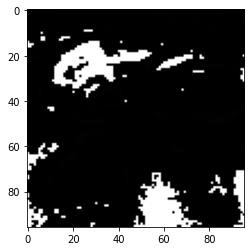

tf.Tensor(0.5636215, shape=(), dtype=float32)


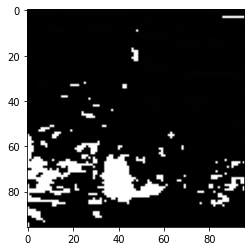

tf.Tensor(0.54189545, shape=(), dtype=float32)


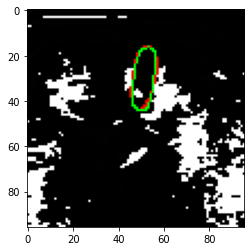

tf.Tensor(0.9126684, shape=(), dtype=float32)


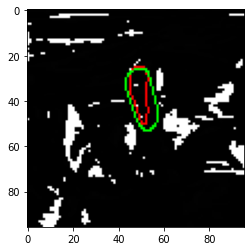

tf.Tensor(0.6713681, shape=(), dtype=float32)


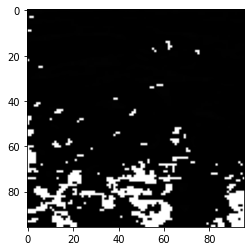

tf.Tensor(0.5477542, shape=(), dtype=float32)


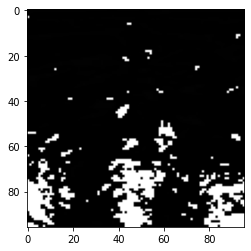

tf.Tensor(0.5478262, shape=(), dtype=float32)


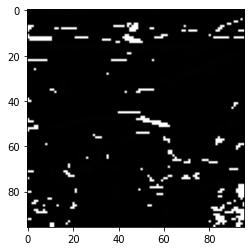

tf.Tensor(0.53439593, shape=(), dtype=float32)


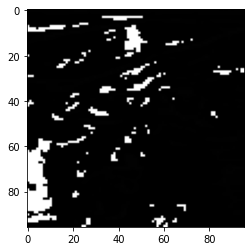

tf.Tensor(0.54048574, shape=(), dtype=float32)


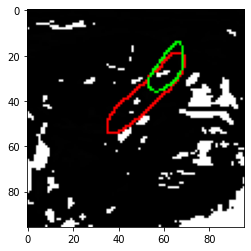

tf.Tensor(0.49144536, shape=(), dtype=float32)


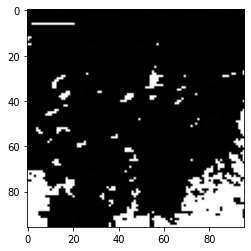

tf.Tensor(0.553431, shape=(), dtype=float32)


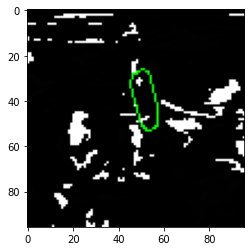

tf.Tensor(0.004453083, shape=(), dtype=float32)


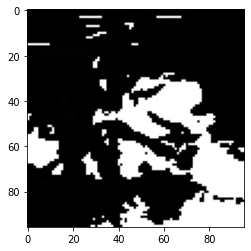

tf.Tensor(0.5701281, shape=(), dtype=float32)


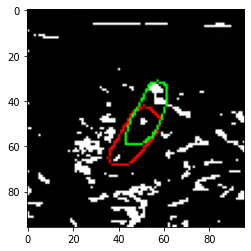

tf.Tensor(0.55873203, shape=(), dtype=float32)


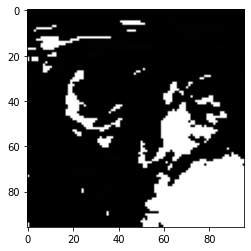

tf.Tensor(0.5731471, shape=(), dtype=float32)


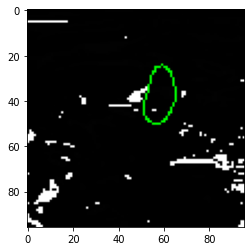

tf.Tensor(0.003756609, shape=(), dtype=float32)


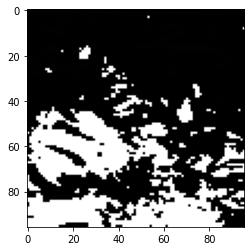

tf.Tensor(0.5763504, shape=(), dtype=float32)


In [ ]:
for i in np.arange(100):
    
    pred_img=np.asarray(Double_UNET.predict(np.asarray(imgs_validation_doubleunet[i].reshape( 1, 96,96,3 )))).reshape(96,96,1)
    pred_mask=((pred_img[:,:,0]*255.).astype(np.uint8))
    
    real_mask=((imgs_mask_validation_doubleunet[i][:,:,0]*255.).astype(np.uint8))

    real_image=((imgs_validation_doubleunet[i][:,:,0]).astype(np.uint8))

    image_with_real_mask=image_with_mask(real_image, real_mask)

    imshow(image_with_mask1(image_with_real_mask, pred_mask))

    show()

    
    


    print(dice_coef( (imgs_mask_validation_doubleunet[i]),  (pred_img) ))
    


    
    


## <h1> Prediction and submission part

In [16]:
test_images=np.load('test_data.npy')
test_ids=np.load('test_ids.npy')

imgs_test = preprocess_images(test_images, 96,96)

imgs_test=imgs_test.astype('float32')

imgs_test -= train_images_mean
imgs_test /= train_images_std




In [17]:
imgs_test.shape

(5508, 96, 96, 3)

In [38]:
image_rows = 420
image_cols = 580

def prep(img):
    img = img.astype('float32')
    img = (img > 0.5)
  
    img = resize(img, (image_cols, image_rows), preserve_range=True)
    return img


def run_length_enc(label):
    from itertools import chain
    x = label.transpose().flatten()
    y = np.where(x > 0)[0]
    if len(y) < 10:  # consider as empty
        return ''
    z = np.where(np.diff(y) > 1)[0]
    start = np.insert(y[z+1], 0, y[0])
    end = np.append(y[z], y[-1])
    length = end - start
    res = [[s+1, l+1] for s, l in zip(list(start), list(length))]
    res = list(chain.from_iterable(res))
    return ' '.join([str(r) for r in res])

In [ ]:
#classification_model.load_weights('Classification_model_weights.h5')
#Double_UNET.load_weights('Double_UNET_model_weights.h5')
argsort = np.argsort(test_ids)
imgs_id_test = test_ids[argsort]
imgs_test = imgs_test[argsort]
first_row = 'img,pixels'

with open('submission_file','w+') as f:
    f.write(first_row+'\n')
    for i in tqdm(range(imgs_test.shape[0])):
        prediction= classification_model.predict(imgs_test[i].reshape(1,96,96,3))[0]

        if (prediction>=0.5):
            
            img=Double_UNET.predict(imgs_test[i].reshape( 1, 96,96,3 ))[0,:,:,0]
            
            img=prep(img)
            
            rle=run_length_enc(img)
            
            s=str(imgs_id_test[i])+','+rle 
            f.write(s + '\n')

            
        else:
           
            s=str(imgs_id_test[i])+','+  ''
            f.write(s + '\n')
        
        

        
            
       
    

